## Capstone Project : Mahindra First Choice

### Problem Statement
Mahindra First Choice Services (MFCS) is a company of Mahindra Group and is India’s leading chain of multi-brand car workshops with over 335+ workshops present in 267+ towns & 24 states. It has serviced over 10,50,000 cars. The company aims to establish countrywide network of over 400 workshops by March 2018.
Mahindra would now like to leverage the data that they have and address the key issues they have. Read along to know how you can help them improve their business.
The dataset consist of three aspects:
* Customer data: where the details of the customer like the car owned, state and place of residence, order type, etc are present. Data dimension is of 534000 Customer entries
* Invoice data: where information related to customer visits and transactions are recorded, whether a customer as insurance claims, bifurcation of the amount 
 paid, for what type of service did the customer came for, etc…
* Material Inventory: where information related to what kind of service did the customer took and what kind of material was used to service, Labor information and the cost for the service, Plant and plant name where the customer took the service.


### Objective

### Geolocation Based Customer Analysis:
The idea is to explore how various factors like car make & model, time and type of service etc. vary with location. Since the servicing industry is local in nature, this kind of an analysis could possibly render some really interesting business insights.
Furthermore, this analysis will enable us to formulate more concrete machine learning problems.
From the data at hand it is possible to extract insights about customer behaviour especially the following questions can be addressed

#### Problem Statement-1
Identifying the ownership pattern of cars throughout the country. This also captures the problem wherein information regarding the spending patterns can be identified Expected Business Outcome: Mahindra First Choice Services will be benefited in multiple ways. Knowing the ownership pattern targeted marketing campaigns could be carried out. Knowing the spending patterns services could be suited to the particular spending pattern.

#### Problem Statement-2
Identify the type of order each state receives and present it as an interactive visualization. Expected Business Outcome: This could potentially give information about how Mahindra First Choice needs to be prepared to tackle various seasonal cases

### Market Segmentation:
Market segmentation is the process of dividing a market of potential customers into internally homogeneous and mutually heterogeneous groups or segments, based on different characteristics captured in the data. Groups created through such a segmentation exercise many times reveal behavioral patterns which are different from generally accepted segments by the business. The exercise is broadly known as “clustering” and is aimed at finding the consumers who will respond similarly to various stimuli by detecting underlying behavior patterns.
Though clustering falls under a Machine Learning problem category called unsupervised learning, which requires extensive efforts, it is possible to carry out a visual analysis in a relatively short timespan.

#### Problem Statement: 
Customer Lifetime value prediction - Based on Customer segments, predict the revenue that can be extracted from each segment over a life of the car -Regression/Time Series.


#### Objective:
- To Help Mahindra improve its business from analysing the data given like max. car model coming for repair location-wise, top sales garage etc
- To Identify more profitable area or expansion in other regions

#### Stakeholders:
- Marketing Head of Mahindra First [For Marketing Campaign]
- Operational Head/State Head of Mahindra First [For knowing In-Outs operation in Garage]
- Project Manager [i.e. Our Consulting Firm Manager - To which Mahindra First Company are first point of contact with for Analysis]

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',50)
# !pip install pgeocode
import pgeocode
nomi = pgeocode.Nominatim('IN')
import warnings
warnings.simplefilter('ignore')

In [220]:
# !pip install plotly_express

In [3]:
import os
os.getcwd()

'C:\\Users\\RUPA\\Desktop\\MFCS CAPSTONE'

In [4]:
invoice_data = pd.read_csv('Final_invoice.csv')
customer_data =pd.read_excel('Customer_Data.xlsx')

In [5]:
print("invoice data shape" , invoice_data.shape)
print("customer data shape" ,customer_data.shape)

invoice data shape (492314, 59)
customer data shape (555338, 9)


In [6]:
invoice_data.isnull().sum()/invoice_data.shape[0] * 100

Unnamed: 0               0.000000
Amt Rcvd From Custom    40.073205
Amt Rcvd From Ins Co    40.073205
Area / Locality          4.852594
CGST(14%)               40.073205
                          ...    
Total GST               40.073205
Total IGST              40.073205
Total SGST/UGST         40.073205
Total Value             40.073205
User ID                  0.000000
Length: 59, dtype: float64

In [7]:
customer_data.isnull().sum()/customer_data.shape[0] * 100

Business Partner     0.000000
Customer No.         0.000000
Partner Type         0.014046
Data Origin          0.024490
Title                8.338525
Marital Status      97.112209
Occupation          97.378533
Date of Birth       97.579132
Death date          99.880613
dtype: float64

In [8]:
## dropping records more than 50% missing values from customer data 
customer_data = customer_data.drop(['Title','Marital Status','Occupation','Date of Birth','Death date'],axis=1)

# Imputing Partner type & Data origin with mode

customer_data['Partner Type'] = customer_data['Partner Type'].fillna(customer_data['Partner Type'].mode()[0])
customer_data['Data Origin'] = customer_data['Data Origin'].fillna(customer_data['Data Origin'].mode()[0])

In [9]:
customer_data.isnull().sum()/customer_data.shape[0] * 100

Business Partner    0.0
Customer No.        0.0
Partner Type        0.0
Data Origin         0.0
dtype: float64

In [10]:
## dropping records more than 50% missing values
invoice_data = invoice_data.drop(['Amt Rcvd From Custom','Amt Rcvd From Ins Co',
                                          'CGST(14%)','CGST(2.5%)', 'CGST(6%)','IGST(12%)','CGST(9%)',
                                          'IGST(18%)','IGST(28%)','IGST(5%)','SGST/UGST(14%)',
                                          'SGST/UGST(2.5%)','SGST/UGST(6%)','SGST/UGST(9%)',
                                          'TDS amount','Service Advisor Name','Outstanding Amt',
                                        'Total CGST','Total GST','Total IGST','Total SGST/UGST',
                                          'Policy no.','Cash /Cashless Type','Expiry Date','Gate Pass Date',
                                          'Insurance Company','Claim No.'
                                         ],axis=1)

In [11]:
invoice_data.isnull().sum()/invoice_data.shape[0] * 100

Unnamed: 0             0.000000
Area / Locality        4.852594
CITY                   0.000203
Cust Type              0.000000
Customer No.           0.000000
District               0.000000
Gate Pass Time         0.000000
Invoice Date           0.000000
Invoice No             0.000000
Invoice Time           0.000000
Job Card No            0.000000
JobCard Date           0.000000
JobCard Time           0.000000
KMs Reading            0.000000
Labour Total           0.000000
Make                   0.000000
Misc Total             0.000000
Model                  0.309762
ODN No.               40.073205
OSL Total              0.000000
Order Type             0.000000
Parts Total            0.000000
Pin code               0.000000
Plant                  0.000000
Plant Name1            0.000000
Print Status           0.000000
Recovrbl Exp           0.000000
Regn No                0.003250
Technician Name       48.106290
Total Amt Wtd Tax.     0.000000
Total Value           40.073205
User ID 

### Deriving invoice date time , job card date time & service time

In [12]:
invoice_data["Invoice_DateTime"]=invoice_data["Invoice Date"]+' '+invoice_data["Invoice Time"]
invoice_data["JobCard_DateTime"]=invoice_data["JobCard Date"]+' '+invoice_data["JobCard Time"]
invoice_data['JobCard_DateTime'] = pd.to_datetime(invoice_data['JobCard_DateTime'],dayfirst=True)
invoice_data['Invoice_DateTime'] = pd.to_datetime(invoice_data['Invoice_DateTime'],dayfirst=True)
invoice_data["Service_Time"]=invoice_data["Invoice_DateTime"]-invoice_data["JobCard_DateTime"]

In [13]:
invoice_data.head()

,Unnamed: 0,Area / Locality,CITY,Cust Type,Customer No.,District,Gate Pass Time,Invoice Date,Invoice No,Invoice Time,Job Card No,JobCard Date,JobCard Time,KMs Reading,Labour Total,Make,Misc Total,Model,ODN No.,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Technician Name,Total Amt Wtd Tax.,Total Value,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time
0,0,MAJIWADA,Thane,Retail,67849,Maharashtra,00:00:00,2015-01-02,7005200002,11:30:36,168303,2014-12-13,14:29:43,49317,1203.14,GENERAL MOTORS,0.00,SPARK,7.005200e+09,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,RUPESH,4051.95,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53
1,1,THNAE,THNAE,Retail,84419,Maharashtra,00:00:00,2015-01-03,7005200003,10:07:32,173997,2015-01-02,14:12:18,78584,804.26,TATA MOTORS,197.03,INDICA,7.005200e+09,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,PRASHANT,1001.29,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14
2,2,THANE,THANE[W],Retail,81055,Maharashtra,00:00:00,2015-01-03,7005200004,11:12:57,173889,2015-01-02,11:40:44,33985,180.19,MARUTI SUZUKI,0.00,ZEN,7.005200e+09,0.00,Running Repairs,52.95,400607,BC01,THANE,NO,0.0,AP09AX0582,IMRAN,233.14,233.14,BC01SA2,2015-01-03 11:12:57,2015-01-02 11:40:44,0 days 23:32:13
3,3,THNAE,THNAE,Retail,84419,Maharashtra,00:00:00,2015-01-03,7005200005,11:40:44,174158,2015-01-03,10:12:32,78584,0.00,TATA MOTORS,0.00,INDICA,7.005200e+09,0.00,SMC Redemption,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,PRASHANT,0.00,0.00,BC01SA2,2015-01-03 11:40:44,2015-01-03 10:12:32,0 days 01:28:12
4,4,THANE,THANE,Retail,18980,Maharashtra,00:00:00,2015-01-03,7005200006,12:07:17,173860,2015-01-02,10:45:42,50057,1202.97,HYUNDAI,100.00,SANTRO XING,7.005200e+09,499.99,Paid Service,944.16,400603,BC01,THANE,NO,0.0,MH04CD9768,DAYANAND,2747.12,2747.12,BC01SA2,2015-01-03 12:07:17,2015-01-02 10:45:42,1 days 01:21:35


In [14]:
#split datetime column
invoice_data['Year']  = invoice_data['Invoice_DateTime'].dt.year
invoice_data['Month'] = invoice_data['Invoice_DateTime'].dt.month

invoice_data.drop(['JobCard Date','JobCard Time','Invoice Date','Invoice Time'],axis = 1,inplace=True)

In [15]:
invoice_data.drop(['Unnamed: 0'],axis = 1,inplace=True)

In [16]:
invoice_data.head()

,Area / Locality,CITY,Cust Type,Customer No.,District,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,ODN No.,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Technician Name,Total Amt Wtd Tax.,Total Value,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month
0,MAJIWADA,Thane,Retail,67849,Maharashtra,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,7.005200e+09,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,RUPESH,4051.95,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1
1,THNAE,THNAE,Retail,84419,Maharashtra,00:00:00,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,7.005200e+09,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,PRASHANT,1001.29,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1
2,THANE,THANE[W],Retail,81055,Maharashtra,00:00:00,7005200004,173889,33985,180.19,MARUTI SUZUKI,0.00,ZEN,7.005200e+09,0.00,Running Repairs,52.95,400607,BC01,THANE,NO,0.0,AP09AX0582,IMRAN,233.14,233.14,BC01SA2,2015-01-03 11:12:57,2015-01-02 11:40:44,0 days 23:32:13,2015,1
3,THNAE,THNAE,Retail,84419,Maharashtra,00:00:00,7005200005,174158,78584,0.00,TATA MOTORS,0.00,INDICA,7.005200e+09,0.00,SMC Redemption,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,PRASHANT,0.00,0.00,BC01SA2,2015-01-03 11:40:44,2015-01-03 10:12:32,0 days 01:28:12,2015,1
4,THANE,THANE,Retail,18980,Maharashtra,00:00:00,7005200006,173860,50057,1202.97,HYUNDAI,100.00,SANTRO XING,7.005200e+09,499.99,Paid Service,944.16,400603,BC01,THANE,NO,0.0,MH04CD9768,DAYANAND,2747.12,2747.12,BC01SA2,2015-01-03 12:07:17,2015-01-02 10:45:42,1 days 01:21:35,2015,1


### Cleaning "Area/Locality", "City" and "District" columns using pgeocode library  

In [17]:
nomi.query_postal_code('400607')

postal_code                               400607
country code                                  IN
place_name        Chitalsar Manpada, Sandozbaugh
state_name                           Maharashtra
state_code                                    16
county_name                                Thane
county_code                                  517
community_name                             Thane
community_code                               NaN
latitude                                 19.1941
longitude                                73.0002
accuracy                                       1
Name: 0, dtype: object

In [18]:
invoice_data["Clean_CITY"]=nomi.query_postal_code(np.array(invoice_data["Pin code"].astype(str))).county_name
invoice_data["Clean_District"]=nomi.query_postal_code(np.array(invoice_data["Pin code"].astype(str))).state_name
invoice_data["Clean_Location_Area"]=nomi.query_postal_code(np.array(invoice_data["Pin code"].astype(str))).place_name

In [19]:
invoice_data["latitude"]=nomi.query_postal_code(np.array(invoice_data["Pin code"].astype(str))).latitude
invoice_data["longitude"]=nomi.query_postal_code(np.array(invoice_data["Pin code"].astype(str))).longitude

### Dropping old "Area/Locality", "City" and "District" columns 

In [20]:
invoice_data.drop(["Area / Locality","CITY","District"],1,inplace=True)

In [21]:
invoice_data.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,ODN No.,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Technician Name,Total Amt Wtd Tax.,Total Value,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,7.005200e+09,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,RUPESH,4051.95,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002
1,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,7.005200e+09,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,PRASHANT,1001.29,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002
2,Retail,81055,00:00:00,7005200004,173889,33985,180.19,MARUTI SUZUKI,0.00,ZEN,7.005200e+09,0.00,Running Repairs,52.95,400607,BC01,THANE,NO,0.0,AP09AX0582,IMRAN,233.14,233.14,BC01SA2,2015-01-03 11:12:57,2015-01-02 11:40:44,0 days 23:32:13,2015,1,Thane,Maharashtra,"Chitalsar Manpada, Sandozbaugh",19.1941,73.0002
3,Retail,84419,00:00:00,7005200005,174158,78584,0.00,TATA MOTORS,0.00,INDICA,7.005200e+09,0.00,SMC Redemption,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,PRASHANT,0.00,0.00,BC01SA2,2015-01-03 11:40:44,2015-01-03 10:12:32,0 days 01:28:12,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002
4,Retail,18980,00:00:00,7005200006,173860,50057,1202.97,HYUNDAI,100.00,SANTRO XING,7.005200e+09,499.99,Paid Service,944.16,400603,BC01,THANE,NO,0.0,MH04CD9768,DAYANAND,2747.12,2747.12,BC01SA2,2015-01-03 12:07:17,2015-01-02 10:45:42,1 days 01:21:35,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002


In [22]:
invoice_data.dtypes

Cust Type                       object
Customer No.                    object
Gate Pass Time                  object
Invoice No                       int64
Job Card No                      int64
KMs Reading                      int64
Labour Total                   float64
Make                            object
Misc Total                     float64
Model                           object
ODN No.                        float64
OSL Total                      float64
Order Type                      object
Parts Total                    float64
Pin code                         int64
Plant                           object
Plant Name1                     object
Print Status                    object
Recovrbl Exp                   float64
Regn No                         object
Technician Name                 object
Total Amt Wtd Tax.             float64
Total Value                    float64
User ID                         object
Invoice_DateTime        datetime64[ns]
JobCard_DateTime        d

### Storing Cleaned Invoice & Customer Data 

In [23]:
# invoice_data.to_csv('Invoice_Data.csv')
# customer_data.to_csv('Customer_Data.csv')

### Reading cleaned Invoice & Customer Data 

In [24]:
# invoice_data = pd.read_csv('Invoice_Data.csv',index_col= False)
# customer_data = pd.read_csv('Customer_Data.csv',index_col = False)
jtd_data = pd.read_csv('JTD.csv')

In [25]:
print("invoice data shape" , invoice_data.shape)
print(" customer data shape" ,customer_data.shape)
print(" jtd data shape", jtd_data.shape)

invoice data shape (492314, 34)
 customer data shape (555338, 4)
 jtd data shape (5619484, 10)


In [26]:
customer_data.isnull().sum()

Business Partner    0
Customer No.        0
Partner Type        0
Data Origin         0
dtype: int64

In [27]:
invoice_data.isnull().sum()/invoice_data.shape[0] * 100

Cust Type               0.000000
Customer No.            0.000000
Gate Pass Time          0.000000
Invoice No              0.000000
Job Card No             0.000000
KMs Reading             0.000000
Labour Total            0.000000
Make                    0.000000
Misc Total              0.000000
Model                   0.309762
ODN No.                40.073205
OSL Total               0.000000
Order Type              0.000000
Parts Total             0.000000
Pin code                0.000000
Plant                   0.000000
Plant Name1             0.000000
Print Status            0.000000
Recovrbl Exp            0.000000
Regn No                 0.003250
Technician Name        48.106290
Total Amt Wtd Tax.      0.000000
Total Value            40.073205
User ID                 0.000000
Invoice_DateTime        0.000000
JobCard_DateTime        0.000000
Service_Time            0.000000
Year                    0.000000
Month                   0.000000
Clean_CITY              9.596721
Clean_Dist

In [28]:
jtd_data.isnull().sum()/jtd_data.shape[0] * 100

Unnamed: 0              0.000000
DBM Order               0.000000
Order Item              0.000000
Material                0.918750
Labor Value Number     67.159778
Description             0.918750
Item Category           0.000000
Order Quantity          0.000000
Target quantity UoM     0.918750
Net value               0.000000
dtype: float64

#### Dropping unncessary columns & columns with more missing values

In [29]:
# # dropping unnecessary columns
# customer_data.drop(['Unnamed: 0'],axis=1,inplace=True)

In [30]:
invoice_data.drop(['ODN No.','Technician Name','Total Value'],axis=1,inplace=True)

In [31]:
jtd_data.drop(['Unnamed: 0','Labor Value Number'],axis=1,inplace=True)

In [32]:
jtd_data.head()

,DBM Order,Order Item,Material,Description,Item Category,Order Quantity,Target quantity UoM,Net value
0,22385,180,OSLCC_SRV31,MACHINING RR.SUSPENSION CHARGE (MAJOR),P010,1.2,MIN,1869.87
1,23910,10,1DM279018170117,ASSY.OIL COOLER (6-PLATE) (VOR,P002,1.0,EA,2151.13
2,23910,40,1IS150203BE01,FRONT WHEEL BEARING/ LUBRICATE,P002,1.0,EA,2552.92
3,23910,60,1DM279001990173,ASSY.CYL.HEAD W /O INJ.(NA W /O,P002,1.0,EA,20360.14
4,23910,70,1DM88552790S001SA,Engine Overhaul Kit -Indica Di,P002,1.0,EA,10691.63


In [33]:
invoice_data.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002
1,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002
2,Retail,81055,00:00:00,7005200004,173889,33985,180.19,MARUTI SUZUKI,0.00,ZEN,0.00,Running Repairs,52.95,400607,BC01,THANE,NO,0.0,AP09AX0582,233.14,BC01SA2,2015-01-03 11:12:57,2015-01-02 11:40:44,0 days 23:32:13,2015,1,Thane,Maharashtra,"Chitalsar Manpada, Sandozbaugh",19.1941,73.0002
3,Retail,84419,00:00:00,7005200005,174158,78584,0.00,TATA MOTORS,0.00,INDICA,0.00,SMC Redemption,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,0.00,BC01SA2,2015-01-03 11:40:44,2015-01-03 10:12:32,0 days 01:28:12,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002
4,Retail,18980,00:00:00,7005200006,173860,50057,1202.97,HYUNDAI,100.00,SANTRO XING,499.99,Paid Service,944.16,400603,BC01,THANE,NO,0.0,MH04CD9768,2747.12,BC01SA2,2015-01-03 12:07:17,2015-01-02 10:45:42,1 days 01:21:35,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002


In [34]:
customer_data.sample(10)

,Business Partner,Customer No.,Partner Type,Data Origin
284967,306188,294593,1.0,Z005
400825,425619,413784,1.0,Z018
473504,500648,488723,1.0,Z013
181159,197501,187685,1.0,Z001
520740,549350,537367,1.0,Z006
183030,199492,189629,1.0,Z004
548094,577884,565799,1.0,Z005
429281,454903,443046,1.0,Z006
296532,318089,306464,1.0,Z004
362797,386423,374653,1.0,Z011


### Joining Invoice & Customer Data

In [35]:
inv_cust = pd.merge(invoice_data,customer_data,how='left',on='Customer No.')

In [36]:
inv_cust.shape

(492314, 34)

In [37]:
inv_cust.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN
1,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN
2,Retail,81055,00:00:00,7005200004,173889,33985,180.19,MARUTI SUZUKI,0.00,ZEN,0.00,Running Repairs,52.95,400607,BC01,THANE,NO,0.0,AP09AX0582,233.14,BC01SA2,2015-01-03 11:12:57,2015-01-02 11:40:44,0 days 23:32:13,2015,1,Thane,Maharashtra,"Chitalsar Manpada, Sandozbaugh",19.1941,73.0002,NaN,NaN,NaN
3,Retail,84419,00:00:00,7005200005,174158,78584,0.00,TATA MOTORS,0.00,INDICA,0.00,SMC Redemption,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,0.00,BC01SA2,2015-01-03 11:40:44,2015-01-03 10:12:32,0 days 01:28:12,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN
4,Retail,18980,00:00:00,7005200006,173860,50057,1202.97,HYUNDAI,100.00,SANTRO XING,499.99,Paid Service,944.16,400603,BC01,THANE,NO,0.0,MH04CD9768,2747.12,BC01SA2,2015-01-03 12:07:17,2015-01-02 10:45:42,1 days 01:21:35,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN


### Joining inv_cust with jtd data

#### grouping the jtd data on dbm order to reduce duplicate order entries

In [38]:
jtd_group=jtd_data.groupby(["DBM Order","Item Category"],as_index=False).agg({"Net value":'sum',"Order Quantity":"sum"})

In [39]:
jtd_group.head()

,DBM Order,Item Category,Net value,Order Quantity
0,4,P001,3455.92,714.0
1,4,P002,11042.62,15.6
2,4,P010,2399.95,1.0
3,4,P011,100.00,1.0
4,5,P001,2310.47,283.0


In [40]:
jtd_group.shape

(1735310, 4)

In [41]:
invoice_customer_jtd=pd.merge(inv_cust,jtd_group,how="left",left_on="Job Card No",right_on="DBM Order")

In [42]:
invoice_customer_jtd.shape

(936275, 38)

In [43]:
# invoice_customer_jtd.to_csv('cleaned_merged_data.csv')

In [44]:
invoice_customer_jtd.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P001,1203.14,73.0
1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P002,2348.75,6.5
2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P010,500.06,1.0
3,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P001,804.26,170.0
4,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA MOTORS,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P011,197.03,1.0


In [45]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity'],
      dtype='object')

In [46]:
invoice_customer_jtd.Make.value_counts()

MARUTI SUZUKI           279627
MAHINDRA &  MAHINDRA    176101
HYUNDAI                 168912
TATA MOTORS             106569
GENERAL MOTORS           54158
FORD                     39999
TOYOTA                   33424
HONDA                    28294
FIAT                     12110
SKODA                    11173
VOLKSWAGEN               10180
RENAULT                   5395
NISSAN                    5246
MITSUBISHI MOTORS         2435
DAEWOO                     722
MERCEDES BENZ              355
BMW                        330
HINDUSTAN MOTORS           315
FORCE                      313
AUDI                       260
PREMIER AUTOMOBILES        170
SONALIKA                   110
LAND ROVER                  25
VOLVO                       22
SAN MOTORS                  10
JEEP                         9
PORCHE                       8
MORRIS                       3
Name: Make, dtype: int64

In [47]:
# Replace values in Make column
def replacement(dataset, col, dict_replacement, regex=False):
    dataset[col] = dataset[col].replace(dict_replacement, regex=regex )
    return dataset
make_replacements = {
                    'MAHINDRA &  MAHINDRA': 'MAHINDRA',
                    'TATA MOTORS': 'TATA',
                    'MARUTI SUZUKI': 'MARUTI',
                    'MERCEDES BENZ': 'MERCEDES-BENZ',
                    'PORCHE': 'PORSCHE',
                    'LAND ROVER' : 'ROVER',
                    'MITSUBISHI MOTORS':'MITSUBISHI MOTOR',
                    'PREMIER AUTOMOBILES': 'PREMIERAUTO'
                    }
invoice_customer_jtd = replacement(invoice_customer_jtd, 'Make', make_replacements)
# invoice_df  = replacement(invoice_df, 'Make', make_replacements)

In [48]:
invoice_customer_jtd.Make.value_counts()

MARUTI                 279627
MAHINDRA               176101
HYUNDAI                168912
TATA                   106569
GENERAL MOTORS          54158
FORD                    39999
TOYOTA                  33424
HONDA                   28294
FIAT                    12110
SKODA                   11173
VOLKSWAGEN              10180
RENAULT                  5395
NISSAN                   5246
MITSUBISHI MOTOR         2435
DAEWOO                    722
MERCEDES-BENZ             355
BMW                       330
HINDUSTAN MOTORS          315
FORCE                     313
AUDI                      260
PREMIER AUTOMOBILES       170
SONALIKA                  110
ROVER                      25
VOLVO                      22
SAN MOTORS                 10
JEEP                        9
PORSCHE                     8
MORRIS                      3
Name: Make, dtype: int64

In [49]:
geo_district = invoice_customer_jtd[['Customer No.', 'Clean_District']]
geo_district = geo_district.groupby('Clean_District').count()
geo_district.columns = ['No. of Customers']
sorted_geo_district = geo_district.sort_values('No. of Customers', ascending=False)
sorted_geo_district.reset_index(inplace=True)
temp1 = sorted_geo_district.loc[:50]

In [50]:
temp1.head()

,Clean_District,No. of Customers
0,Maharashtra,228496
1,Tamil Nadu,197669
2,Karnataka,74881
3,Telangana,59555
4,Uttar Pradesh,56391


In [51]:
geo_district_order = invoice_customer_jtd[['Customer No.', 'Order Type', 'Clean_District']]
geo_district_order = geo_district_order.groupby(['Order Type', 'Clean_District']).count()
geo_district_order.columns = ["No. of Customers"]
#sorted_geo_district_order = geo_district_order.sort_values('Order Type', ascending=False)

In [52]:
geo_district_order.sort_values(['Order Type', 'No. of Customers'], ascending=[True, False], inplace=True)

In [53]:
invoice_customer_jtd['Order Type'].unique()

array(['Paid Service', 'SMC Value Package', 'Running Repairs',
       'SMC Redemption', 'Accidental', 'Repeat Order', 'Workshop Damage',
       'Mechanical', 'WBW Order'], dtype=object)

In [54]:
order_type = ['Paid Service', 'SMC Value Package', 'Running Repairs',
       'SMC Redemption', 'Accidental', 'Repeat Order', 'Workshop Damage',
       'Mechanical', 'WBW Order']
for order in order_type:
    print(order)
    print(geo_district_order.loc[order], "\n")

Paid Service
                                          No. of Customers
Clean_District                                            
Maharashtra                                          85525
Tamil Nadu                                           58558
Telangana                                            21039
Karnataka                                            20927
Uttar Pradesh                                        18964
Punjab                                               12280
Gujarat                                              11069
Haryana                                               8206
Madhya Pradesh                                        6549
Andhra Pradesh                                        6346
Rajasthan                                             6165
Delhi                                                 2524
Kerala                                                2398
Pondicherry                                           2332
Uttarakhand                                

                  No. of Customers
Clean_District                    
Tamil Nadu                    6223
Maharashtra                   5822
Karnataka                     3311
Rajasthan                     1539
Madhya Pradesh                1498
Telangana                     1140
Punjab                        1031
Andhra Pradesh                 856
Gujarat                        805
Haryana                        785
Uttar Pradesh                  351
Chandigarh                     225
Uttarakhand                    183
Himachal Pradesh               166
Bihar                          137
Pondicherry                    104
Kerala                          67
Delhi                           48
West Bengal                     39
Jharkhand                        4
Goa                              2 

WBW Order
                  No. of Customers
Clean_District                    
Rajasthan                        7
Punjab                           6
Himachal Pradesh                 4
Uttarakh

In [55]:
revenue_order_district = invoice_customer_jtd[['Order Type', 'Clean_District', 'Total Amt Wtd Tax.']]
revenue_order_district = revenue_order_district.groupby(['Order Type', 'Clean_District']).sum()
revenue_order_district.columns = ['Rev']
revenue_order_district.reset_index(inplace=True)
temp2 = pd.pivot_table(revenue_order_district, values='Rev', index=['Clean_District'], columns='Order Type')

In [56]:
temp2.head()

Order Type,Accidental,Mechanical,Paid Service,Repeat Order,Running Repairs,SMC Redemption,SMC Value Package,WBW Order,Workshop Damage
Clean_District,,,,,,,,,
Andhra Pradesh,66370680.67,3636584.70,38057109.31,0.0,59123731.75,56144.0,2470477.84,NaN,NaN
Arunachal Pradesh,NaN,NaN,NaN,NaN,480.93,NaN,NaN,NaN,NaN
Assam,46418.94,NaN,133116.28,NaN,48092.98,NaN,NaN,NaN,NaN
Bihar,6650645.83,532664.51,10124296.62,0.0,8528413.38,0.0,53987.76,NaN,NaN
Chandigarh,11163083.71,595838.38,5419163.50,0.0,3014476.17,0.0,587080.25,NaN,NaN


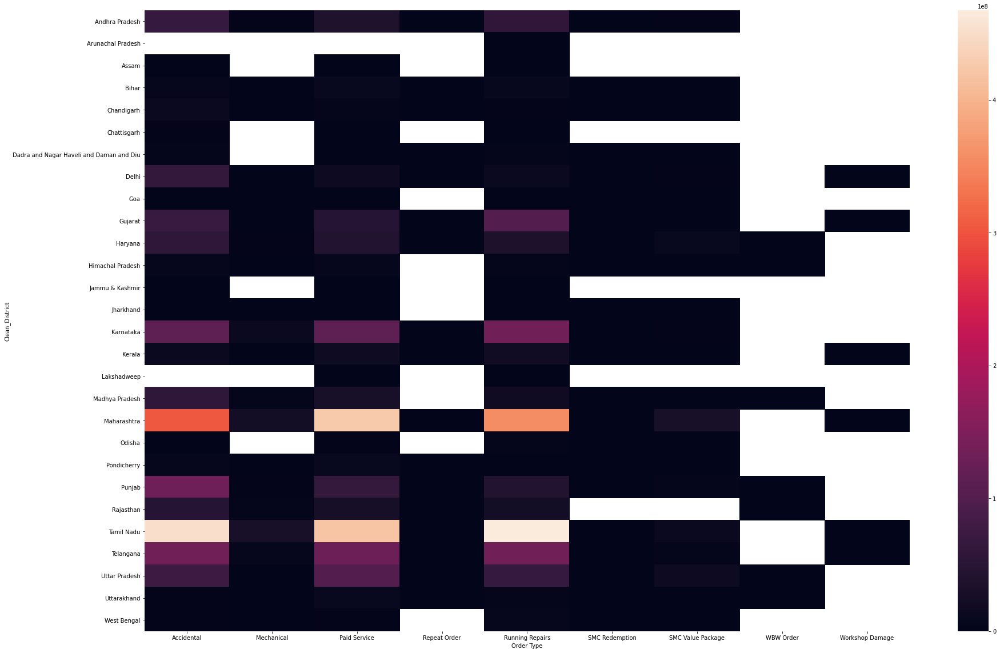

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=[30, 20])
sns.heatmap(temp2)
plt.show()
#plt.savefig(r'images/geo_order_heatmap.png')

In [58]:
custtype_rev = invoice_customer_jtd[['Cust Type', 'Total Amt Wtd Tax.', 'Order Type']]
custtype_rev_avg = custtype_rev.groupby(['Cust Type', 'Order Type']).mean()
custtype_rev_avg.reset_index(inplace=True)

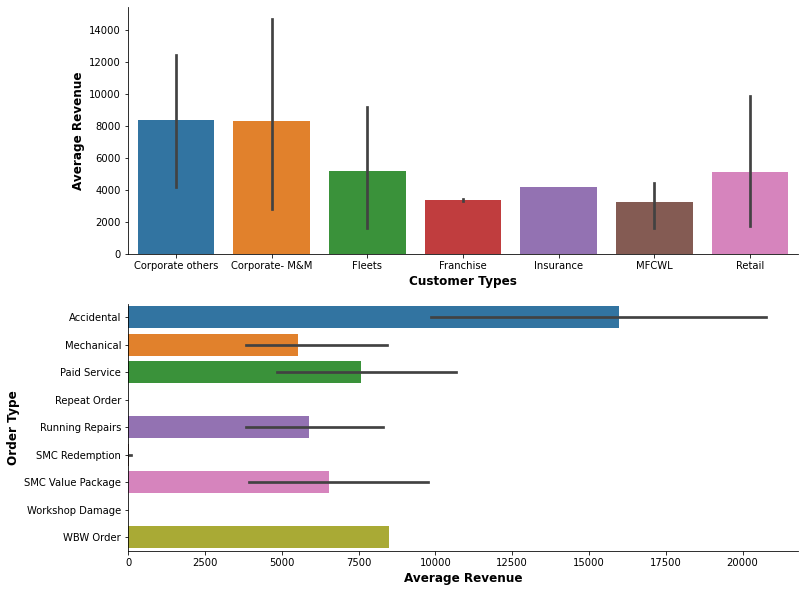

In [59]:
fig, ax = plt.subplots(2,1, figsize=[12,10])
sns.barplot(x='Cust Type', y='Total Amt Wtd Tax.', data=custtype_rev_avg, ax=ax[0])
sns.barplot(x='Total Amt Wtd Tax.', y='Order Type', data=custtype_rev_avg, ax=ax[1])
ax[0].set_xlabel("Customer Types", fontsize=12, fontweight='semibold')
ax[0].set_ylabel("Average Revenue", fontsize=12, fontweight='semibold')
ax[1].set_xlabel("Average Revenue", fontsize=12, fontweight='semibold')
ax[1].set_ylabel("Order Type", fontsize=12, fontweight='semibold')
sns.despine()
#plt.savefig(r'images/order_cust_rev.png')

## 1.Problem Statement- :

Identifying the ownership pattern of cars throughout the country. This also captures the problem wherein information regarding the spending patterns can be identified.

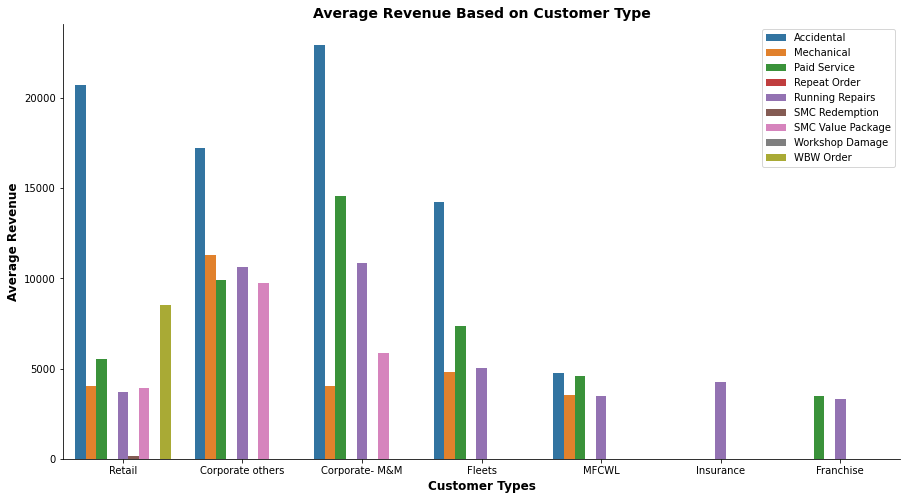

In [60]:
fig, ax = plt.subplots(1,1, figsize=[15,8])
sns.barplot(x='Cust Type', y='Total Amt Wtd Tax.', hue='Order Type', data=custtype_rev_avg, order=['Retail', 'Corporate others', 'Corporate- M&M', 'Fleets', 'MFCWL',
       'Insurance', 'Franchise'])
ax.legend(loc=1)
ax.set_xlabel("Customer Types", fontsize=12, fontweight='semibold')
ax.set_ylabel("Average Revenue", fontsize=12, fontweight='semibold')
ax.set_title("Average Revenue Based on Customer Type", fontweight='semibold', fontsize=14)
sns.despine()
#plt.savefig(r'images/rev_cust_bar.png')

In [61]:
def get_top_values(dataset,col,min_percentage):
    filtered_df = dataset[col].value_counts()
    filtered_df=filtered_df.reset_index()
    filtered_df[col] = (filtered_df[col]/sum(filtered_df[col]))*100
    filtered_df = filtered_df.sort_values(col)
    filtered_df = filtered_df[filtered_df[col]>min_percentage]
    top_values  = filtered_df['index'].tolist()
    top_values_df = dataset[dataset[col].isin(top_values)]
    return top_values_df, top_values

In [62]:
def count_hue_plot(dataset,x_col, hue_col, min_percentage,title=None):
    sns.set(style="darkgrid")
    fig, ax = plt.subplots(figsize=(20, 10))
    filtered_df1, filter_col_values1 = get_top_values(dataset, x_col, min_percentage)
    filtered_df, filter_col_values = get_top_values(filtered_df1, hue_col, min_percentage)
    sns.countplot(x=x_col, data=filtered_df, hue=hue_col)
    if(title==None):
        plt.title("'{}' wise distribution for '{}'".format(x_col,hue_col))
    plt.xticks(rotation='vertical')
    plt.show()

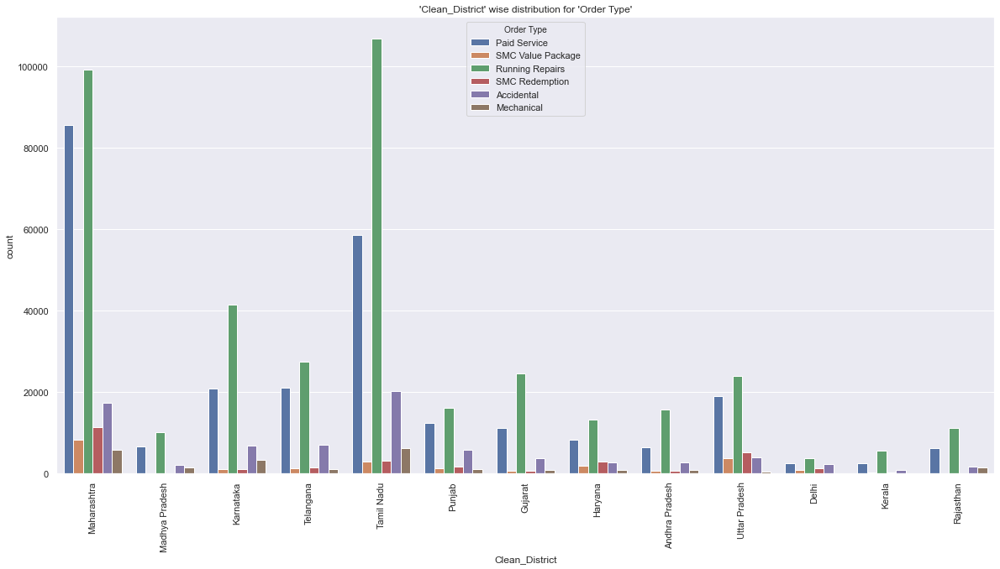

In [63]:
count_hue_plot(invoice_customer_jtd,'Clean_District','Order Type', 1.0)

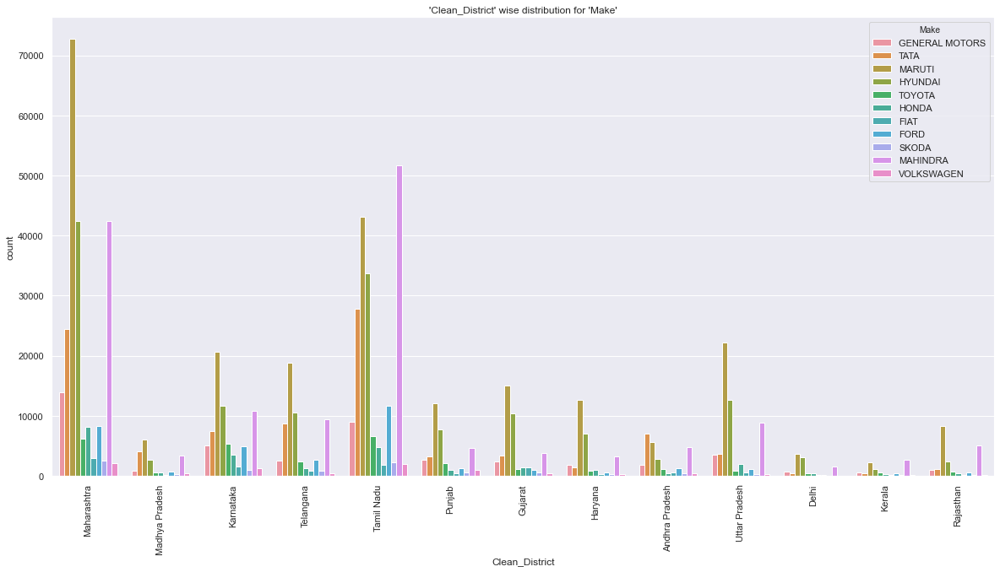

In [64]:
count_hue_plot(invoice_customer_jtd,'Clean_District','Make', 1.0)

In [65]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity'],
      dtype='object')

In [66]:
invoice_customer_jtd.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P001,1203.14,73.0
1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P002,2348.75,6.5
2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051.95,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P010,500.06,1.0
3,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P001,804.26,170.0
4,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001.29,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P011,197.03,1.0


In [67]:
def sum_cols(dataset, cols_to_sum, result_col):
    dataset[result_col] = 0
    for col in cols_to_sum:
        dataset[result_col] = dataset[result_col] + dataset[col]
    return dataset
cost_cols     = ['Misc Total','OSL Total','Parts Total','Total Amt Wtd Tax.']
invoice_customer_jtd =  sum_cols(invoice_customer_jtd, cost_cols, 'Total_Expense')

In [68]:
def plot_TimeSeries(dataset, time_col, cat_col, num_col):
    fig, ax = plt.subplots(figsize=(15,7))
    plt.title("'{}'wise '{}' in top '{}'".format(time_col, num_col, cat_col))
    dataset.groupby([time_col,cat_col])[num_col].sum().unstack().plot(ax=ax,marker='o')

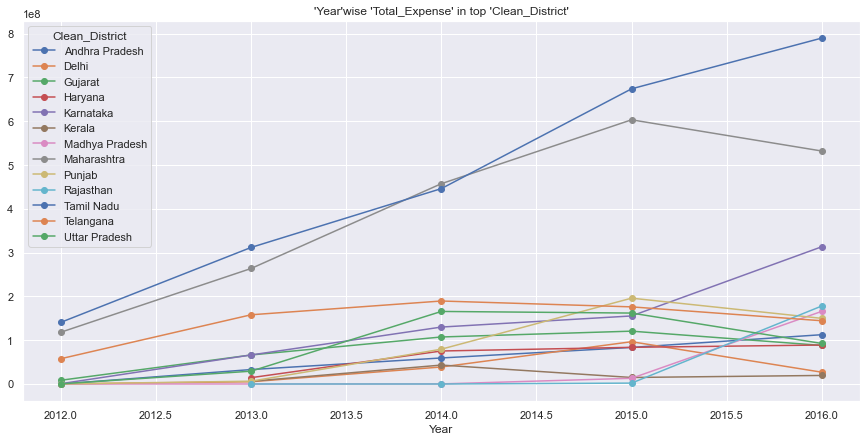

In [69]:
top_state_df, top_state = get_top_values(invoice_customer_jtd, 'Clean_District',1)
plot_TimeSeries(top_state_df,'Year','Clean_District','Total_Expense')

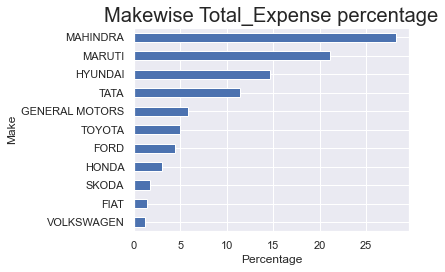

In [70]:
def plot_groupby(df,grpby_col, col):
    gp=df.groupby(grpby_col)[col].sum()
    gp=100*gp/sum(gp)
    gp=gp[gp>1]
    gp.sort_values().plot(kind='barh')
    plt.style.use('fivethirtyeight')
    plt.title('{}wise {} percentage'.format(grpby_col, col))
    plt.xlabel('Percentage')
    plt.tight_layout()

plot_groupby(invoice_customer_jtd,'Make','Total_Expense')

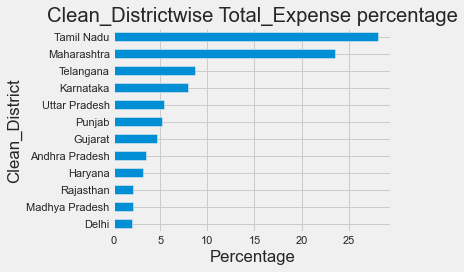

In [71]:
plot_groupby(invoice_customer_jtd,'Clean_District','Total_Expense')

## Problem Statement-2:

Identify the type of order each state receives and present it as an interactive visualization.

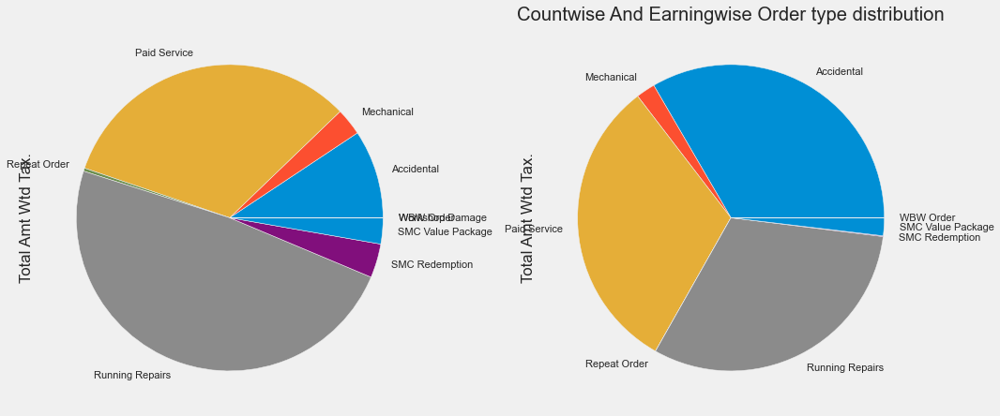

In [72]:
fig,ax = plt.subplots(1,2,figsize=(15,20))
plt.style.use('fivethirtyeight')
invoice_customer_jtd.groupby('Order Type')['Total Amt Wtd Tax.'].count().plot(kind='pie',ax=ax[0])
invoice_customer_jtd.groupby('Order Type')['Total Amt Wtd Tax.'].sum().plot(kind='pie',ax=ax[1])
plt.tight_layout()
plt.title('Countwise And Earningwise Order type distribution')
plt.show()

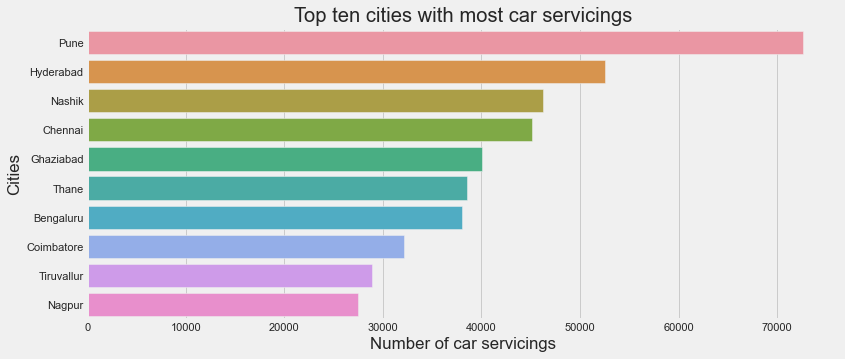

In [73]:
### Area with most number of car servicing

plt.figure(figsize=(12,5),edgecolor='b')
plt.xlabel('Number of car servicings')
plt.ylabel('Cities')
plt.title('Top ten cities with most car servicings')
sns.barplot(y=invoice_customer_jtd['Clean_CITY'].value_counts()[:10].index,
            x=invoice_customer_jtd['Clean_CITY'].value_counts()[:10].values)

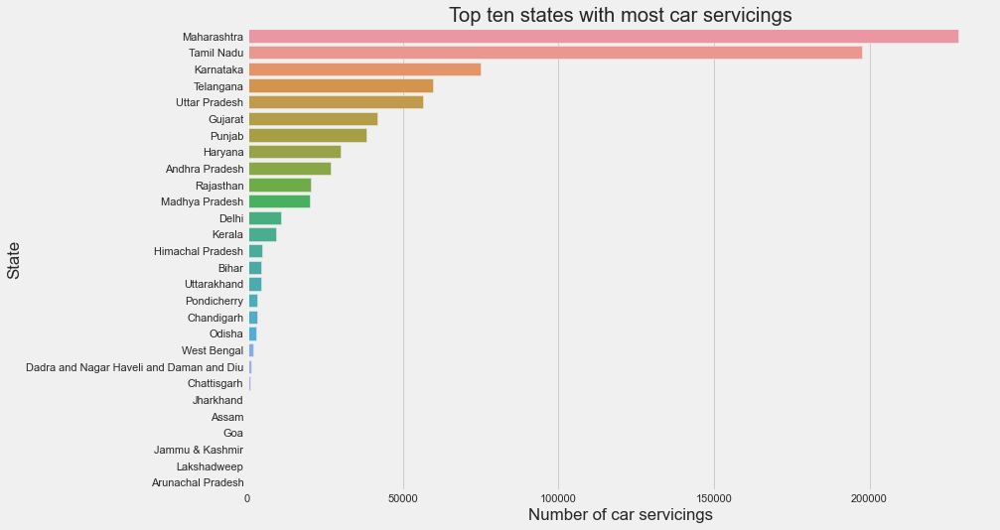

In [74]:
### State with most number of car servicing

plt.figure(figsize=(12,8),edgecolor='b')
plt.xlabel('Number of car servicings')
plt.ylabel('State')
plt.title('Top ten states with most car servicings')
sns.barplot(y=invoice_customer_jtd['Clean_District'].value_counts().index,
            x=invoice_customer_jtd['Clean_District'].value_counts().values)

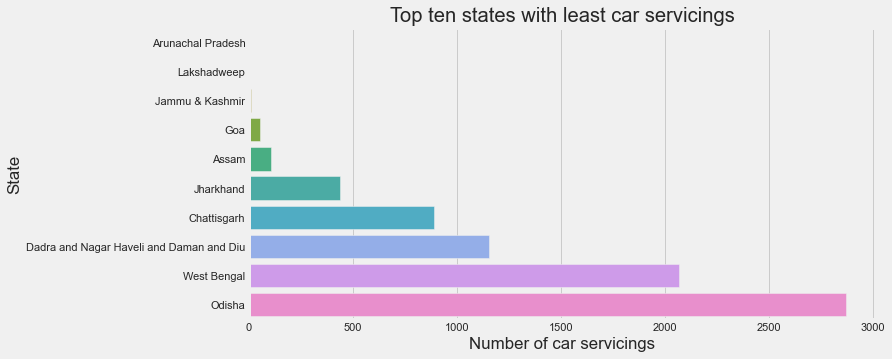

In [75]:
### State with least number of car servicing

plt.figure(figsize=(10,5),edgecolor='b')
plt.xlabel('Number of car servicings')
plt.ylabel('State')
plt.title('Top ten states with least car servicings')
sns.barplot(y=invoice_customer_jtd['Clean_District'].value_counts()[:-11:-1].index,
            x=invoice_customer_jtd['Clean_District'].value_counts()[:-11:-1].values)

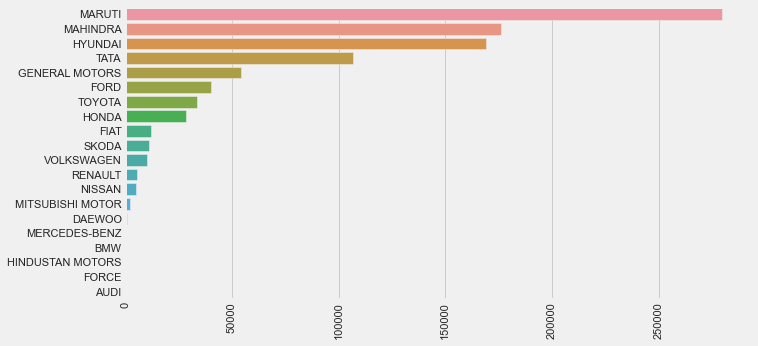

In [76]:
### Most popular make in the servicing centres overall

plt.figure(figsize=(10,5),edgecolor='b')
plt.xticks(rotation='vertical')
sns.barplot(y=invoice_customer_jtd['Make'].value_counts()[:20].index,
            x=invoice_customer_jtd['Make'].value_counts()[:20].values)

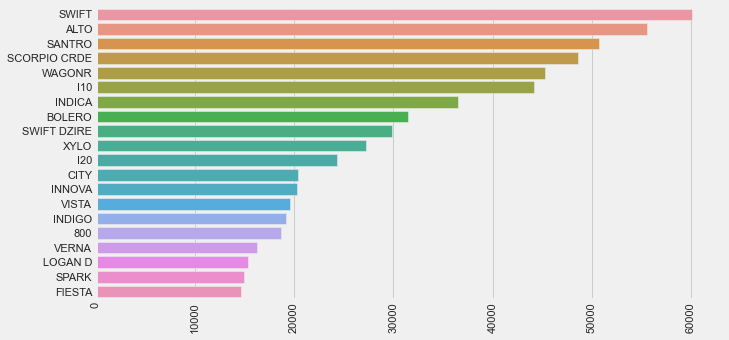

In [77]:
### Most popular model in the servicing centres overall

plt.figure(figsize=(10,5),edgecolor='b')
plt.xticks(rotation='vertical')
sns.barplot(y=invoice_customer_jtd['Model'].value_counts()[:20].index,
            x=invoice_customer_jtd['Model'].value_counts()[:20].values)

In [78]:
make_order_group = invoice_customer_jtd.groupby(['Make','Order Type']).size().sort_values(ascending=False)[:30]

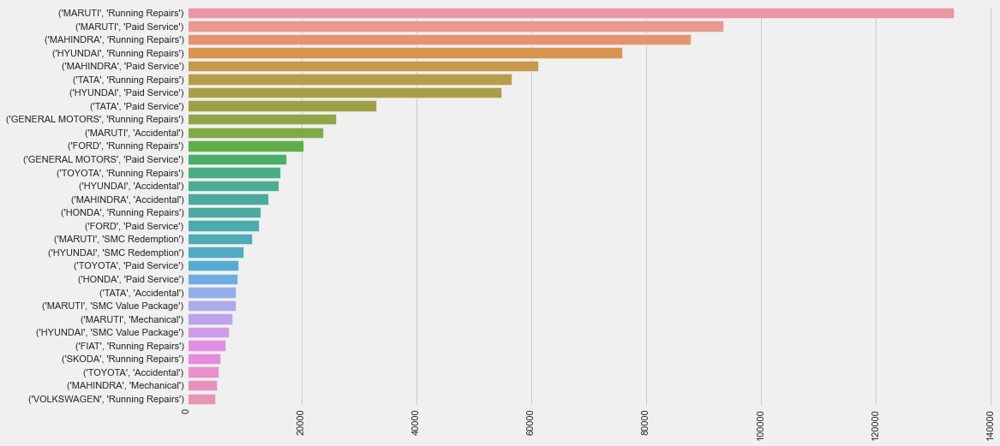

In [79]:
plt.figure(figsize=(15,8),edgecolor='b')
plt.xticks(rotation='vertical')
sns.barplot(x=make_order_group.values,
            y=make_order_group.index)
plt.show()

In [80]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity', 'Total_Expense'],
      dtype='object')

In [81]:
df=invoice_customer_jtd.groupby(['Clean_District']).sum().sort_values(by='Total Amt Wtd Tax.',ascending=False)
amount_state = invoice_customer_jtd.groupby(['Clean_District']).sum().sort_values(by='Total Amt Wtd Tax.',ascending=False)[:10]
amount_state

,Invoice No,Job Card No,KMs Reading,Labour Total,Misc Total,OSL Total,Parts Total,Pin code,Recovrbl Exp,Total Amt Wtd Tax.,Year,Month,latitude,longitude,Partner Type,DBM Order,Net value,Order Quantity,Total_Expense
Clean_District,,,,,,,,,,,,,,,,,,,
Tamil Nadu,1402161753246369,48463388878,16263861514,4.008953e+08,25165929.64,1.653364e+08,7.905938e+08,121676128406,904994.28,1.381991e+09,398270185,1311355,2.350473e+06,1.563201e+07,12759.0,4.845742e+10,5.729819e+08,2.829509e+07,2.363088e+09
Maharashtra,1610825609911127,47565877022,17384604421,3.081385e+08,21041843.05,1.619015e+08,6.504750e+08,94862266729,382843.37,1.141557e+09,460319619,1486601,4.438056e+06,1.706299e+07,12623.0,4.756540e+10,4.575722e+08,2.341825e+07,1.974975e+09
Telangana,418908069815061,9876740760,4648231267,9.482256e+07,9138779.29,5.291637e+07,2.535553e+08,29814034797,170200.48,4.104330e+08,119953048,392962,1.036598e+06,4.679038e+06,3647.0,9.876360e+09,1.577323e+08,1.103574e+07,7.260434e+08
Karnataka,531812399372055,21402575514,5862244670,9.980225e+07,36547835.90,3.695124e+07,2.095708e+08,42421488200,117525.65,3.828721e+08,150898992,491641,1.005151e+06,5.758747e+06,3755.0,2.140059e+10,1.569459e+08,9.991182e+06,6.659420e+08
Uttar Pradesh,397230841865308,11969595520,3632992921,7.427435e+07,6156759.12,2.279169e+07,1.588374e+08,11859291004,55249.68,2.620602e+08,113608647,372577,1.597999e+06,4.391745e+06,6.0,1.196912e+10,9.634001e+07,7.454185e+06,4.498461e+08
Punjab,270382546265445,9700949059,2930843968,6.182991e+07,7043621.09,3.019458e+07,1.478686e+08,5647732671,27120.17,2.469367e+08,77085203,248850,1.179875e+06,2.899288e+06,1191.0,9.700949e+09,8.802075e+07,6.279718e+06,4.320434e+08
Gujarat,295658280492344,8423907204,2830462339,5.355582e+07,4696771.41,3.257569e+07,1.314846e+08,16544105482,2000.00,2.223129e+08,84471160,292918,9.047241e+05,3.062561e+06,437.0,8.423907e+09,8.352707e+07,4.373576e+06,3.910700e+08
Andhra Pradesh,189824475160721,6801604908,2602160933,5.083618e+07,3485865.56,1.568350e+07,9.970918e+07,14018975471,32899.54,1.697147e+08,54024675,178011,4.035080e+05,2.141397e+06,0.0,6.801605e+09,7.800231e+07,8.030904e+06,2.885933e+08
Haryana,210699052886809,6750889806,2091567932,3.503678e+07,6281904.10,1.592851e+07,9.159447e+07,3720319671,4400.00,1.488417e+08,60167146,198996,8.639693e+05,2.298832e+06,0.0,6.750890e+09,5.765539e+07,3.200554e+06,2.626465e+08


In [82]:
# !pip install geopy

In [83]:
amt = invoice_customer_jtd['Clean_District'].unique().tolist()
amt1 = [x for x in amt if str(x) != 'nan']
amt1 = pd.DataFrame(amt1,columns=['State'])
amt1=amt1.drop(amt1.index[9])
amt1.head()

,State
0,Maharashtra
1,Madhya Pradesh
2,Karnataka
3,Telangana
4,Tamil Nadu


In [84]:
amt1["State"]=amt1["State"].astype(str)

In [85]:
from  geopy.geocoders import Nominatim
geolocator = Nominatim(timeout=10)
amt1['longitude'] = amt1['State'].apply(geolocator.geocode).apply(lambda x: x.longitude)

In [86]:
amt1['latitude'] = amt1['State'].apply(geolocator.geocode).apply(lambda x: x.latitude)
amt1

,State,longitude,latitude
0,Maharashtra,76.055457,19.531932
1,Madhya Pradesh,79.394870,23.969928
2,Karnataka,75.722352,14.520390
3,Telangana,79.115166,17.849592
4,Tamil Nadu,78.366535,10.909433
5,Punjab,75.500484,30.929321
6,Pondicherry,79.830645,11.934057
7,Gujarat,72.031497,22.415408
8,Haryana,76.000000,29.000000
10,Andhra Pradesh,80.186381,15.924091


In [87]:
df=df.drop(['Dadra and Nagar Haveli and Daman and Diu'])
df.head()

,Invoice No,Job Card No,KMs Reading,Labour Total,Misc Total,OSL Total,Parts Total,Pin code,Recovrbl Exp,Total Amt Wtd Tax.,Year,Month,latitude,longitude,Partner Type,DBM Order,Net value,Order Quantity,Total_Expense
Clean_District,,,,,,,,,,,,,,,,,,,
Tamil Nadu,1402161753246369,48463388878,16263861514,4.008953e+08,25165929.64,1.653364e+08,7.905938e+08,121676128406,904994.28,1.381991e+09,398270185,1311355,2.350473e+06,1.563201e+07,12759.0,4.845742e+10,5.729819e+08,2.829509e+07,2.363088e+09
Maharashtra,1610825609911127,47565877022,17384604421,3.081385e+08,21041843.05,1.619015e+08,6.504750e+08,94862266729,382843.37,1.141557e+09,460319619,1486601,4.438056e+06,1.706299e+07,12623.0,4.756540e+10,4.575722e+08,2.341825e+07,1.974975e+09
Telangana,418908069815061,9876740760,4648231267,9.482256e+07,9138779.29,5.291637e+07,2.535553e+08,29814034797,170200.48,4.104330e+08,119953048,392962,1.036598e+06,4.679038e+06,3647.0,9.876360e+09,1.577323e+08,1.103574e+07,7.260434e+08
Karnataka,531812399372055,21402575514,5862244670,9.980225e+07,36547835.90,3.695124e+07,2.095708e+08,42421488200,117525.65,3.828721e+08,150898992,491641,1.005151e+06,5.758747e+06,3755.0,2.140059e+10,1.569459e+08,9.991182e+06,6.659420e+08
Uttar Pradesh,397230841865308,11969595520,3632992921,7.427435e+07,6156759.12,2.279169e+07,1.588374e+08,11859291004,55249.68,2.620602e+08,113608647,372577,1.597999e+06,4.391745e+06,6.0,1.196912e+10,9.634001e+07,7.454185e+06,4.498461e+08


In [88]:
df_new = pd.merge(df, amt1, left_on='Clean_District', right_on='State')
df_new.head()

,Invoice No,Job Card No,KMs Reading,Labour Total,Misc Total,OSL Total,Parts Total,Pin code,Recovrbl Exp,Total Amt Wtd Tax.,Year,Month,latitude_x,longitude_x,Partner Type,DBM Order,Net value,Order Quantity,Total_Expense,State,longitude_y,latitude_y
0,1402161753246369,48463388878,16263861514,4.008953e+08,25165929.64,1.653364e+08,7.905938e+08,121676128406,904994.28,1.381991e+09,398270185,1311355,2.350473e+06,1.563201e+07,12759.0,4.845742e+10,5.729819e+08,2.829509e+07,2.363088e+09,Tamil Nadu,78.366535,10.909433
1,1610825609911127,47565877022,17384604421,3.081385e+08,21041843.05,1.619015e+08,6.504750e+08,94862266729,382843.37,1.141557e+09,460319619,1486601,4.438056e+06,1.706299e+07,12623.0,4.756540e+10,4.575722e+08,2.341825e+07,1.974975e+09,Maharashtra,76.055457,19.531932
2,418908069815061,9876740760,4648231267,9.482256e+07,9138779.29,5.291637e+07,2.535553e+08,29814034797,170200.48,4.104330e+08,119953048,392962,1.036598e+06,4.679038e+06,3647.0,9.876360e+09,1.577323e+08,1.103574e+07,7.260434e+08,Telangana,79.115166,17.849592
3,531812399372055,21402575514,5862244670,9.980225e+07,36547835.90,3.695124e+07,2.095708e+08,42421488200,117525.65,3.828721e+08,150898992,491641,1.005151e+06,5.758747e+06,3755.0,2.140059e+10,1.569459e+08,9.991182e+06,6.659420e+08,Karnataka,75.722352,14.520390
4,397230841865308,11969595520,3632992921,7.427435e+07,6156759.12,2.279169e+07,1.588374e+08,11859291004,55249.68,2.620602e+08,113608647,372577,1.597999e+06,4.391745e+06,6.0,1.196912e+10,9.634001e+07,7.454185e+06,4.498461e+08,Uttar Pradesh,80.859666,27.130334


In [89]:
def currency(x, pos):
    'The two args are the value and tick position'    
    return '₹{:1.0f}Cr'.format(x*1e-8)

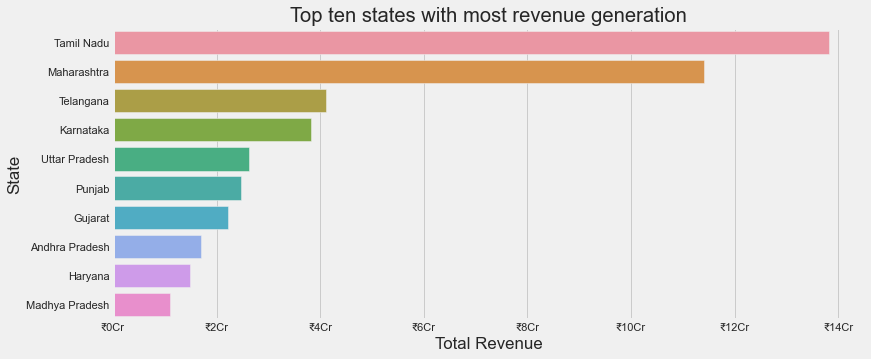

In [90]:
### Plotting the total amount received per state
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(12,5))
formatter = FuncFormatter(currency)
ax.xaxis.set_major_formatter(formatter)

sns.barplot(x=amount_state['Total Amt Wtd Tax.'],
            y=amount_state.index)
ax.set(title='Top ten states with most revenue generation', xlabel='Total Revenue', ylabel='State')
plt.show()


In [217]:
#importing the libraries for map ploting
import os
os.environ['PROJ_LIB'] = 'C:/Users/RUPA/anaconda3.1/Library/share'
from matplotlib import cm
from matplotlib.dates import date2num


In [218]:
import mpl_toolkits
from mpl_toolkits.basemap import Basemap

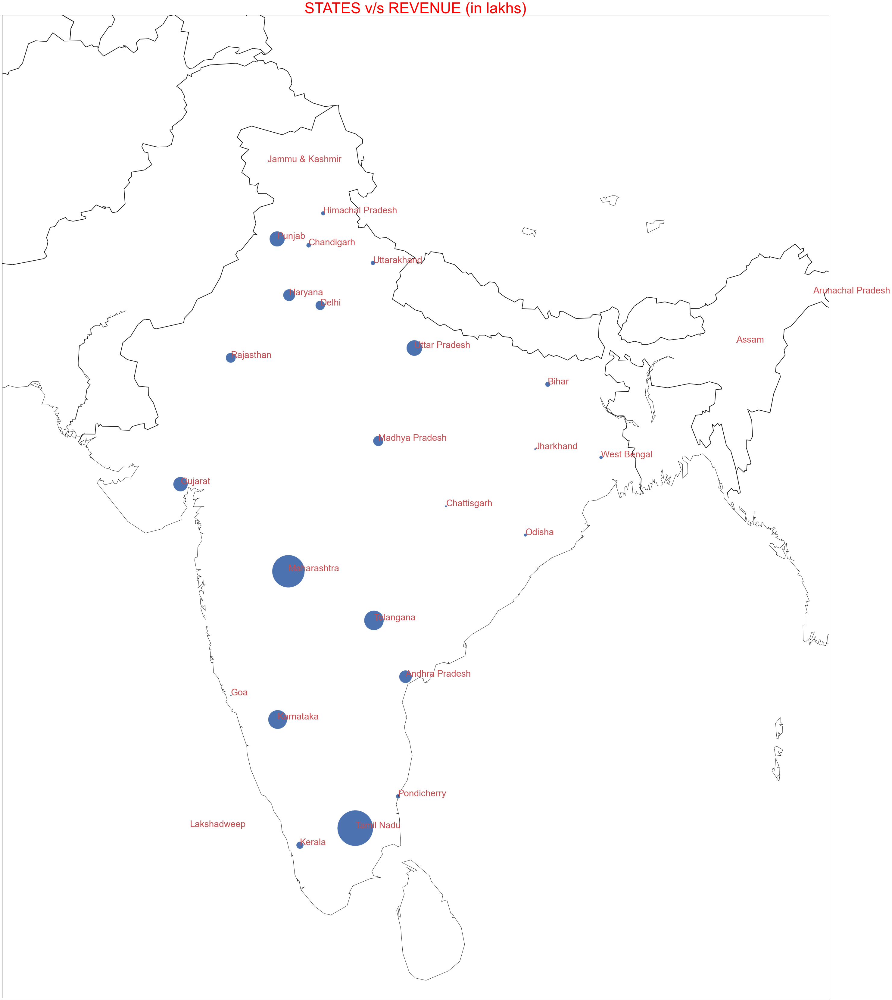

In [219]:
#lets plot with the State names inside the map corresponding to the cities exact co-ordinates which we received from google api ,
# here marker color will be different as per marker size
import matplotlib.pyplot as plt
plt.figure(figsize=(50,60))
map=Basemap(width=120000,height=900000,projection="lcc",resolution="l",llcrnrlon=67,llcrnrlat=5,urcrnrlon=99,urcrnrlat=37,lat_0=28,lon_0=77)
map.drawcountries(linewidth=2)
map.drawmapboundary(fill_color='white')
map.drawcoastlines()
map.drawstates(color='blue')
lg=np.array(df_new["longitude_y"])
lat=np.array(df_new["latitude_y"])
pt=np.array(df_new["Total Amt Wtd Tax."])
state_name=np.array(df_new['State'])
x,y=map(lg,lat)
#Converting revenue in lakhs
p_s=df_new['Total Amt Wtd Tax.']/100000
#plt.scatter takes logitude ,latitude, marker size,shape,and color as parameter in the below , in this plot marker color is different.
plt.scatter(x,y,s=p_s,marker="o",c='b')
for a,b ,c,d in zip(x,y,state_name,pt):
    #plt.text takes x position , y position ,text ,font size and color as arguments
    plt.text(a,b,c,fontsize=30,color="r")
    
plt.title("STATES v/s REVENUE (in lakhs)",fontsize=50,color='RED')
plt.show()

# to save if needed
#plt.savefig('PNG/#282_Custom_Basemap.png', dpi=110, bbox_inches='tight')


In [92]:
amount_state_bottom_10 = invoice_customer_jtd.groupby(['Clean_District']).sum().sort_values(by='Total Amt Wtd Tax.',ascending=False)[:-11:-1]

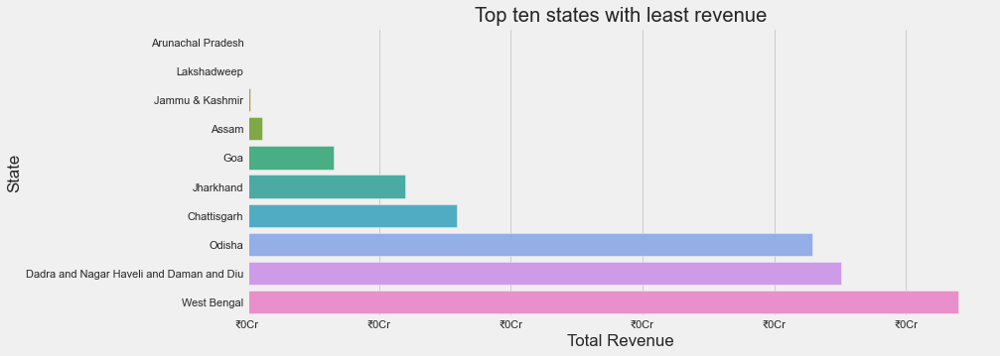

In [93]:
def currency_m(x, pos):
    'The two args are the value and tick position'    
    return '₹{:1.0f}M'.format(x*1e-6)

### Plotting the total amount received per state
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(12,5))
formatter = FuncFormatter(currency)
ax.xaxis.set_major_formatter(formatter)

sns.barplot(x=amount_state_bottom_10['Total Amt Wtd Tax.'],
            y=amount_state_bottom_10.index)
ax.set(title='Top ten states with least revenue', xlabel='Total Revenue', ylabel='State')
plt.show()

In [94]:
invoice_customer_jtd['Year'] = invoice_customer_jtd['Year'].astype(str)
invoice_customer_jtd['Total Amt Wtd Tax.'] = invoice_customer_jtd['Total Amt Wtd Tax.'].astype(int)

In [95]:
(invoice_customer_jtd.groupby(['Make','Order Type']).size()/invoice_customer_jtd[['Order Type','Make']].groupby(['Make']).size()*100)

Make        Order Type       
AUDI        Accidental           26.923077
            Mechanical            3.076923
            Paid Service         16.153846
            Running Repairs      53.846154
BMW         Accidental           25.454545
                                   ...    
VOLKSWAGEN  SMC Redemption        0.923379
            SMC Value Package     0.864440
VOLVO       Accidental            9.090909
            Paid Service         13.636364
            Running Repairs      77.272727
Length: 161, dtype: float64

In [96]:
(invoice_customer_jtd.groupby(['Clean_District','Order Type']).size()/invoice_customer_jtd[['Order Type','Clean_District']].groupby(['Clean_District']).size()*100)

Clean_District  Order Type       
Andhra Pradesh  Accidental            9.786663
                Mechanical            3.192600
                Paid Service         23.668507
                Repeat Order          0.104431
                Running Repairs      58.514844
                                       ...    
West Bengal     Mechanical            1.884058
                Paid Service         16.811594
                Running Repairs      74.685990
                SMC Redemption        0.241546
                SMC Value Package     0.144928
Length: 176, dtype: float64

In [97]:
invoice_customer_jtd[invoice_customer_jtd['Clean_District'] == 'Delhi'].groupby(['Clean_District','Order Type','Year']).size()/invoice_customer_jtd[['Order Type','Clean_District','Year']].groupby(['Clean_District']).size()*100

Clean_District  Order Type         Year
Delhi           Accidental         2012     0.037116
                                   2013     0.584578
                                   2014     3.860072
                                   2015    14.336086
                                   2016     3.136309
                Mechanical         2016     0.445393
                Paid Service       2012     0.018558
                                   2013     0.844391
                                   2014    10.605920
                                   2015     8.740837
                                   2016     3.210541
                Repeat Order       2013     0.092790
                                   2014     0.482509
                                   2015     0.120627
                                   2016     0.009279
                Running Repairs    2012     0.018558
                                   2013     3.553865
                                   2014    15.848566
      

In [98]:
invoice_customer_jtd[invoice_customer_jtd['Clean_District'] == 'Delhi'].groupby(['Make']).size()/invoice_customer_jtd.groupby(['Make']).size()*100

Make
AUDI                   0.384615
BMW                    1.515152
DAEWOO                 0.415512
FIAT                   0.883567
FORCE                       NaN
FORD                   0.510013
GENERAL MOTORS         1.192806
HINDUSTAN MOTORS            NaN
HONDA                  1.625786
HYUNDAI                1.801530
JEEP                        NaN
MAHINDRA               0.885855
MARUTI                 1.308171
MERCEDES-BENZ          1.126761
MITSUBISHI MOTOR       0.369610
MORRIS                      NaN
NISSAN                 0.590926
PORSCHE                     NaN
PREMIER AUTOMOBILES         NaN
RENAULT                0.556070
ROVER                  4.000000
SAN MOTORS                  NaN
SKODA                  0.510158
SONALIKA                    NaN
TATA                   0.462611
TOYOTA                 1.247607
VOLKSWAGEN             0.451866
VOLVO                  9.090909
dtype: float64

In [99]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity', 'Total_Expense'],
      dtype='object')

In [100]:
(invoice_customer_jtd.groupby(['Month','Order Type']).size()/invoice_customer_jtd[['Order Type','Month']].groupby(['Month']).size()*100)

Month  Order Type       
1      Accidental            9.613416
       Paid Service         29.683615
       Repeat Order          0.482621
       Running Repairs      52.368417
       SMC Redemption        4.452461
                              ...    
12     Repeat Order          0.498107
       Running Repairs      53.071915
       SMC Redemption        3.981832
       SMC Value Package     2.757002
       Workshop Damage       0.001514
Length: 87, dtype: float64

In [101]:
((invoice_customer_jtd.groupby(['Clean_District']).sum()['Total Amt Wtd Tax.']/1847738407)*100).sort_values(ascending=False)

Clean_District
Tamil Nadu                                  74.788718
Maharashtra                                 61.775828
Telangana                                   22.211227
Karnataka                                   20.719277
Uttar Pradesh                               14.181527
Punjab                                      13.363360
Gujarat                                     12.030603
Andhra Pradesh                               9.184334
Haryana                                      8.054676
Madhya Pradesh                               5.987046
Rajasthan                                    5.531157
Delhi                                        5.046234
Kerala                                       2.900322
Bihar                                        1.401060
Chandigarh                                   1.124529
Uttarakhand                                  1.013217
Pondicherry                                  1.012689
Himachal Pradesh                             0.915655
West Bengal  

In [102]:
delhi_rev = invoice_customer_jtd[invoice_customer_jtd['Clean_District'] == 'Delhi'].groupby(['Year']).sum()

In [103]:
delhi_rev

,Invoice No,Job Card No,KMs Reading,Labour Total,Misc Total,OSL Total,Parts Total,Pin code,Recovrbl Exp,Total Amt Wtd Tax.,Month,latitude,longitude,Partner Type,DBM Order,Net value,Order Quantity,Total_Expense
Year,,,,,,,,,,,,,,,,,,
2012,56000075420,73806,332412,31598.32,0.00,0.00,40869.28,880168,0.00,72464,66,228.5216,617.351400,0.0,73806.0,36233.80,4476.000,113336.88
2013,4788043914940,43944243,43797549,709329.05,44224.30,459635.41,1710737.99,75285083,0.00,2923624,7392,19573.6543,52842.416269,0.0,43944243.0,1258383.85,35339.460,5138524.45
2014,30527543394676,542918001,291597582,5991975.39,541504.48,2313498.14,13576392.96,480011625,0.00,22421708,27914,124796.4754,336908.336171,0.0,542918001.0,8014233.45,776256.180,38854766.55
2015,30658941553869,999480224,278934907,9294510.60,889523.95,7013215.06,35733227.11,479765920,0.00,52928718,27689,124756.9740,336710.338267,0.0,999480224.0,16883959.54,1960843.528,96566442.84
2016,9676607723544,492222324,96569753,2835037.96,511977.58,1893907.86,9654392.97,150220714,6600.16,14894692,5714,39074.4736,105414.894727,0.0,491823662.0,5763871.93,387814.256,26955594.78


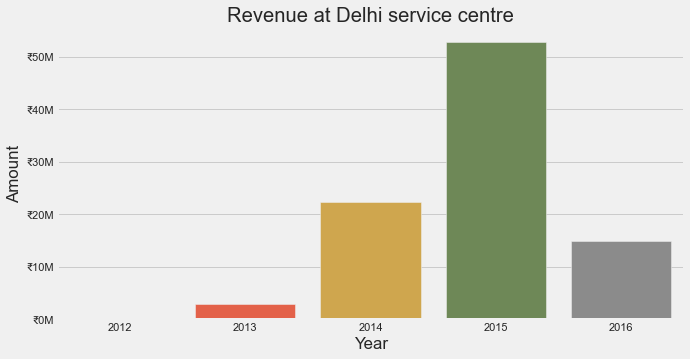

In [104]:
def currency_d(x, pos):
    'The two args are the value and tick position'    
    return '₹{:1.0f}M'.format(x*1e-6)

fig, ax = plt.subplots(figsize=(10,5))
formatter = FuncFormatter(currency_d)
ax.yaxis.set_major_formatter(formatter)

sns.barplot(y=delhi_rev['Total Amt Wtd Tax.'],
            x=delhi_rev.index)
ax.set(title='Revenue at Delhi service centre', xlabel='Year', ylabel='Amount')
plt.show()

In [105]:
kerala_rev = invoice_customer_jtd[invoice_customer_jtd['Clean_District'] == 'Kerala'].groupby(['Year']).sum()

In [106]:
kerala_rev

,Invoice No,Job Card No,KMs Reading,Labour Total,Misc Total,OSL Total,Parts Total,Pin code,Recovrbl Exp,Total Amt Wtd Tax.,Month,latitude,longitude,Partner Type,DBM Order,Net value,Order Quantity,Total_Expense
Year,,,,,,,,,,,,,,,,,,
2013,8078071321710,71557618,76201183,1445508.24,127597.57,294224.79,1959801.82,787251336,0.0,3826597,12209,11639.0344,88060.378725,0.0,7.155762e+07,1690275.52,229970.610,6208756.60
2014,28049515452180,514331312,274867961,7834720.44,444219.93,2739266.39,14515813.93,2734753207,0.0,25532151,27470,40309.2727,305840.958687,232.0,5.143313e+08,9983395.96,566619.501,43233320.94
2015,10059863171249,303153855,107795064,4108409.87,172546.52,797125.77,4423953.72,973130330,0.0,9501341,6549,14196.6274,108770.854738,96.0,3.031539e+08,4195286.93,368729.964,14895661.89
2016,18933498614930,1069520464,217149190,9914584.71,36680.87,25019.89,4755224.94,1791629856,0.0,14730276,17318,27662.7081,200761.511803,16.0,1.069520e+09,10188746.81,533977.505,19548436.11


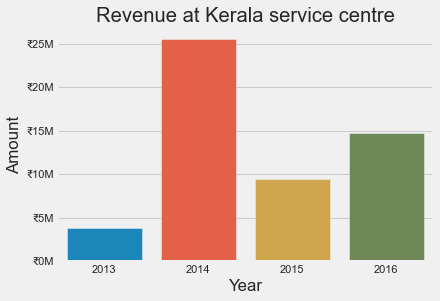

In [107]:
def currency_k(x, pos):
    'The two args are the value and tick position'    
    return '₹{:1.0f}M'.format(x*1e-6)

fig, ax = plt.subplots()
formatter = FuncFormatter(currency_d)
ax.yaxis.set_major_formatter(formatter)

sns.barplot(y=kerala_rev['Total Amt Wtd Tax.'],
            x=kerala_rev.index)
ax.set(title='Revenue at Kerala service centre', xlabel='Year', ylabel='Amount')
plt.show()

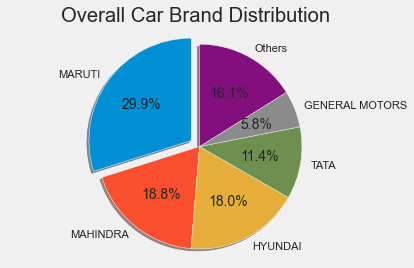

In [108]:
top_5_make = invoice_customer_jtd['Make'].value_counts()[:5]
make_others = pd.Series(data=invoice_customer_jtd['Make'].value_counts()[5:].sum(),index=['Others'])

make_distr = top_5_make.append(make_others)
explode = [0.1,0,0,0,0,0]
fig1, ax1 = plt.subplots()
ax1.pie(make_distr.values,explode = explode, labels=make_distr.index, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax1.set(title='Overall Car Brand Distribution')
plt.show()

In [109]:
# break

In [110]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity', 'Total_Expense'],
      dtype='object')

In [111]:
invoice_customer_jtd["Data Origin"].value_counts()

Z001    33857
Z005     7669
Name: Data Origin, dtype: int64

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [113]:
invoice_customer_jtd["Order Type"].value_counts()

Running Repairs      454904
Paid Service         304691
Accidental            87440
SMC Redemption        33553
Mechanical            26850
SMC Value Package     25715
Repeat Order           3070
WBW Order                35
Workshop Damage          17
Name: Order Type, dtype: int64

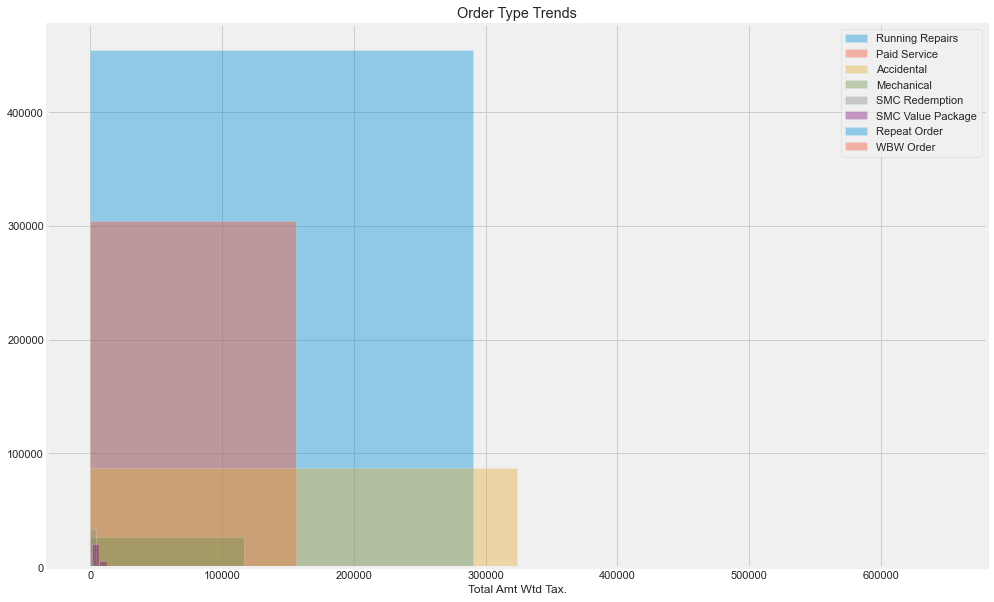

In [114]:
fig, axes = plt.subplots(figsize=(15, 10))

ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="Running Repairs"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Running Repairs", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="Paid Service"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Paid Service", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="Accidental"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Accidental", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="Mechanical"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Mechanical", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="SMC Redemption"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "SMC Redemption", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="SMC Value Package"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "SMC Value Package", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="Repeat Order"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Repeat Order", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_jtd[invoice_customer_jtd['Order Type']=="WBW Order"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "WBW Order", ax = axes, kde =False)
ax.legend()
ax.set_title('Order Type Trends')
plt.show()

In [115]:
invoice_customer_jtd["Clean_District"].value_counts()

Maharashtra                                 228496
Tamil Nadu                                  197669
Karnataka                                    74881
Telangana                                    59555
Uttar Pradesh                                56391
Gujarat                                      41933
Punjab                                       38255
Haryana                                      29863
Andhra Pradesh                               26812
Rajasthan                                    20563
Madhya Pradesh                               20129
Delhi                                        10777
Kerala                                        9220
Himachal Pradesh                              4702
Bihar                                         4571
Uttarakhand                                   4454
Pondicherry                                   3157
Chandigarh                                    3086
Odisha                                        2869
West Bengal                    

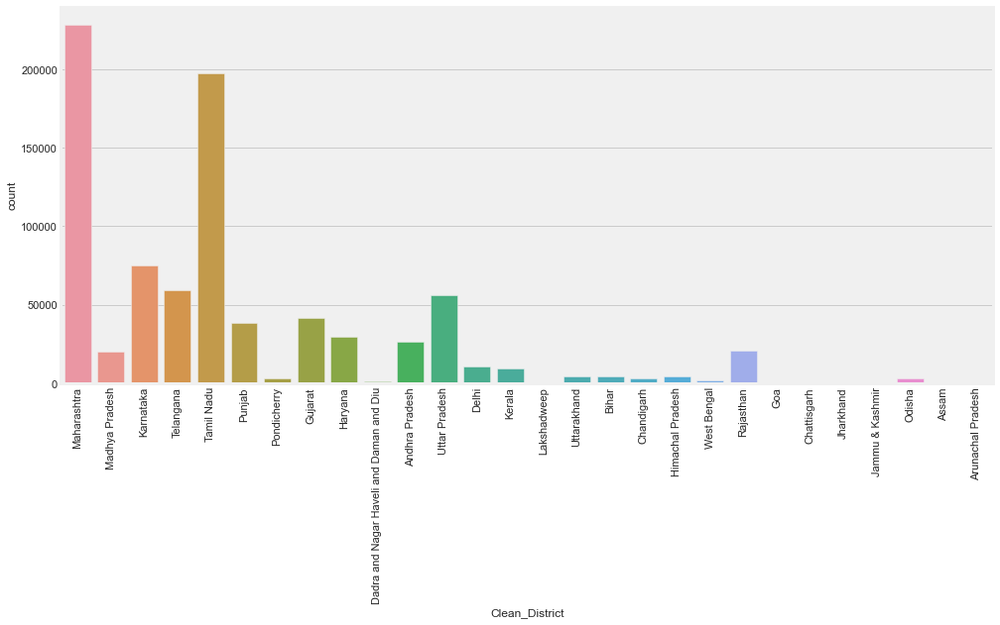

In [116]:
plt.figure(figsize=(15,7))
sns.countplot(invoice_customer_jtd["Clean_District"])
plt.xticks(rotation = 90)
plt.show()

In [117]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity', 'Total_Expense'],
      dtype='object')

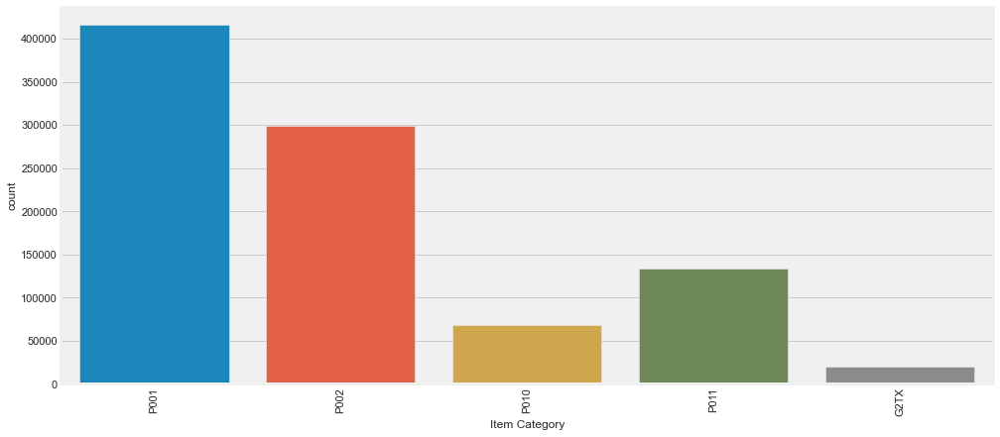

In [118]:
plt.figure(figsize=(15,7))
sns.countplot(invoice_customer_jtd["Item Category"])
plt.xticks(rotation = 90)
plt.show()

In [119]:
invoice_customer_jtd["Make"].value_counts()

MARUTI                 279627
MAHINDRA               176101
HYUNDAI                168912
TATA                   106569
GENERAL MOTORS          54158
FORD                    39999
TOYOTA                  33424
HONDA                   28294
FIAT                    12110
SKODA                   11173
VOLKSWAGEN              10180
RENAULT                  5395
NISSAN                   5246
MITSUBISHI MOTOR         2435
DAEWOO                    722
MERCEDES-BENZ             355
BMW                       330
HINDUSTAN MOTORS          315
FORCE                     313
AUDI                      260
PREMIER AUTOMOBILES       170
SONALIKA                  110
ROVER                      25
VOLVO                      22
SAN MOTORS                 10
JEEP                        9
PORSCHE                     8
MORRIS                      3
Name: Make, dtype: int64

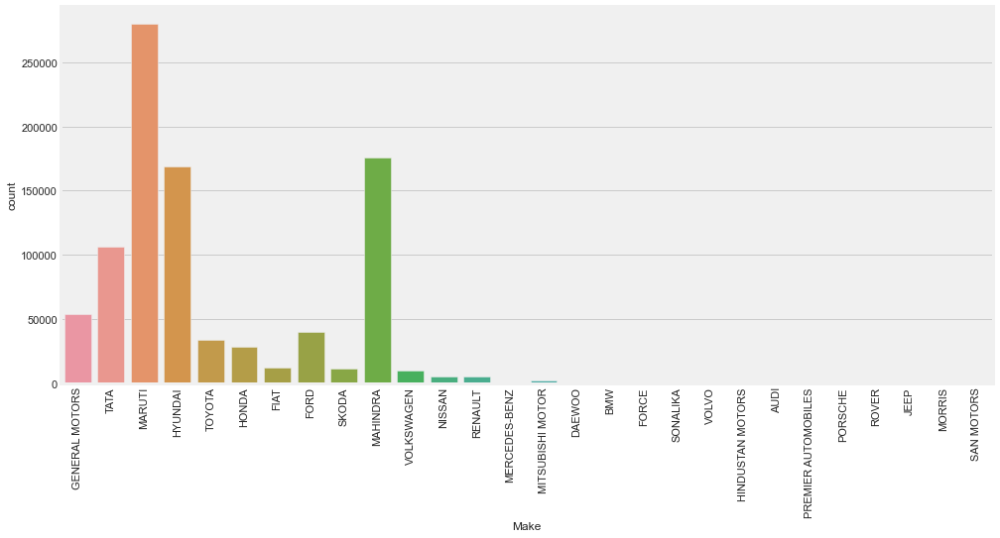

In [120]:
plt.figure(figsize=(15,7))
sns.countplot(invoice_customer_jtd["Make"])
plt.xticks(rotation = 90)
plt.show()

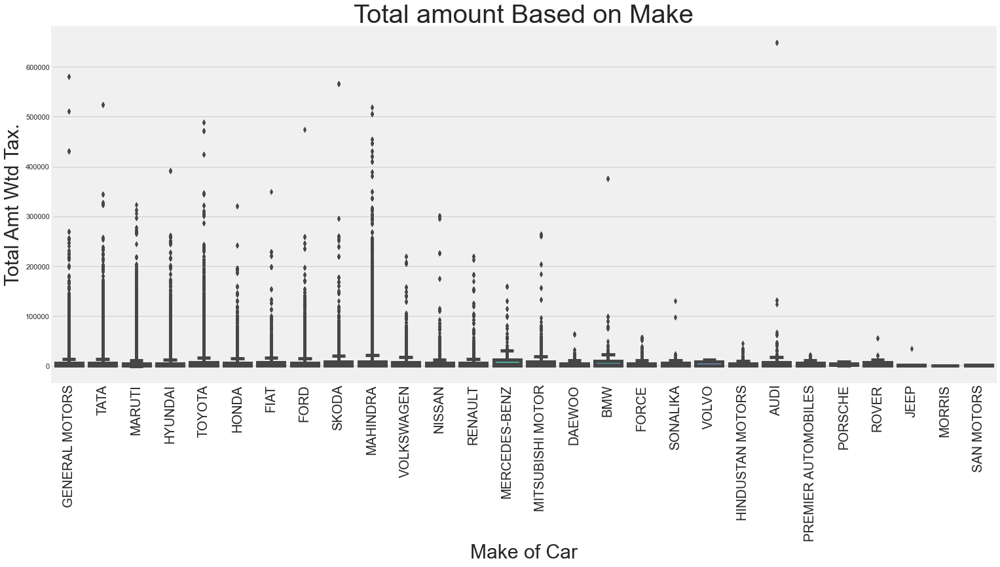

In [121]:
plt.figure(figsize=(23,10))
ax = sns.boxplot(x="Make", y="Total Amt Wtd Tax.", data=invoice_customer_jtd,width=0.8,linewidth=5)
ax.set_xlabel('Make of Car',fontsize=30)
ax.set_ylabel('Total Amt Wtd Tax.',fontsize=30)
plt.title('Total amount Based on Make',fontsize=40)
ax.tick_params(axis='x',labelsize=20,rotation=90)
plt.show()

In [122]:
invoice_customer_jtd.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P001,1203.14,73.0,6900.76
1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P002,2348.75,6.5,6900.76
2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P010,500.06,1.0,6900.76
3,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P001,804.26,170.0,1198.32
4,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P011,197.03,1.0,1198.32


In [123]:
invoice_customer_jtd['Order Type'].value_counts()

Running Repairs      454904
Paid Service         304691
Accidental            87440
SMC Redemption        33553
Mechanical            26850
SMC Value Package     25715
Repeat Order           3070
WBW Order                35
Workshop Damage          17
Name: Order Type, dtype: int64

In [124]:
service_timings = invoice_customer_jtd.groupby(['Order Type'])['Service_Time'].mean(numeric_only=False).to_frame()

In [125]:
service_timings.reset_index()

,Order Type,Service_Time
0,Accidental,10 days 15:04:03.152847
1,Mechanical,3 days 23:21:44.338026
2,Paid Service,3 days 07:26:39.179847
3,Repeat Order,3 days 14:10:58.386644
4,Running Repairs,2 days 22:31:13.376191
5,SMC Redemption,3 days 00:41:56.138914
6,SMC Value Package,0 days 10:48:37.405094
7,WBW Order,5 days 23:53:45.457142
8,Workshop Damage,36 days 09:56:30.058823


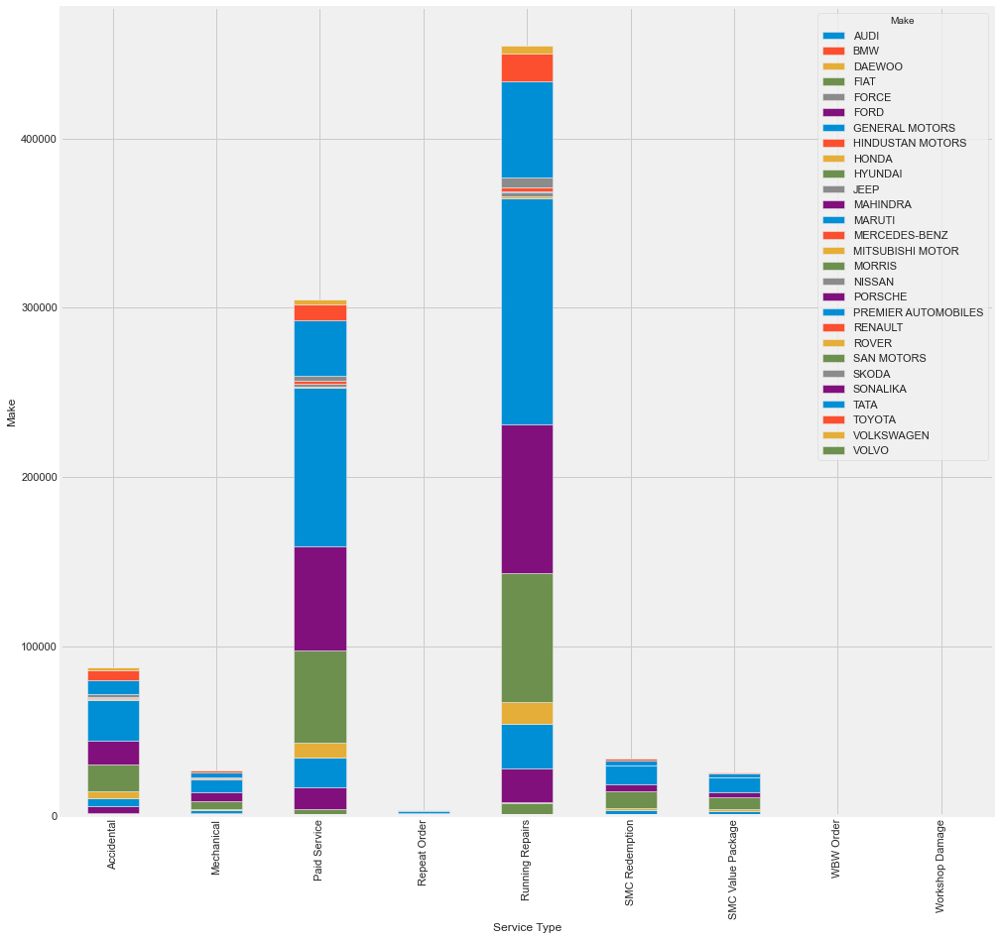

In [126]:
#What is service structure for particular make/car?
res = invoice_customer_jtd.groupby(['Order Type','Make']).size().unstack()

res.plot(kind='bar', stacked=True, figsize=(15,15))
plt.xlabel('Service Type')
plt.ylabel('Make')

plt.show()

In [222]:
import plotly.offline as pyoff
import plotly.graph_objs as go
# import plotly.express as px
import numpy as np
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib
import warnings
import math
import gc 

warnings.filterwarnings('ignore')
pd.options.display.max_columns=99

In [128]:
cars = invoice_customer_jtd[["Make", "Model", "Regn No"]].drop_duplicates().dropna()
duplicate_cars = cars[cars.duplicated("Regn No")].sort_values("Regn No").drop_duplicates()
final_cars = cars[~cars["Regn No"].isin(duplicate_cars["Regn No"])]
final_cars["Car"] = final_cars["Make"] + " " + final_cars["Model"]

In [129]:
final_cars.head()

,Make,Model,Regn No,Car
0,GENERAL MOTORS,SPARK,KA19MA1291,GENERAL MOTORS SPARK
3,TATA,INDICA,MH43R3046,TATA INDICA
5,MARUTI,ZEN,AP09AX0582,MARUTI ZEN
9,HYUNDAI,SANTRO XING,MH04CD9768,HYUNDAI SANTRO XING
13,TOYOTA,INNOVA,MH04GM2960,TOYOTA INNOVA


In [ ]:
px.bar(
    final_cars["Car"].value_counts().iloc[:50][-1::-1].reset_index(),
    y="index",
    x="Car",
    template='plotly_dark',
    title={
#         'text': "Top 20 Cars",
#         'y':0.85,
#         'x':0.5
#         'xanchor': 'center',
#         'yanchor': 'top'
    },
    labels={'Car':"Count", "index":""},
    orientation='h'
)


In [ ]:
invoice_customer_jtd.head()

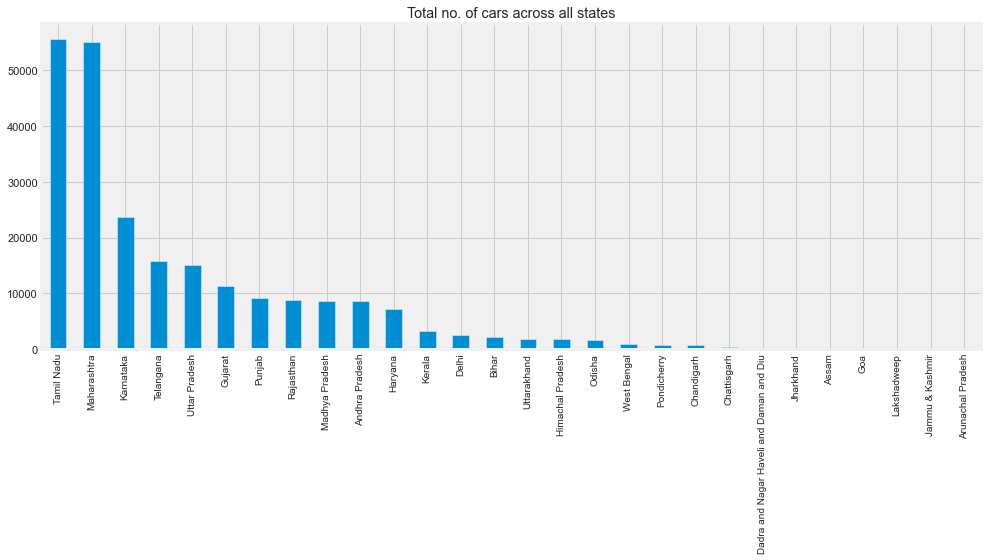

In [130]:
#For car we have mutiple entries in Invoice remove duplicate records 
df_car_regn = invoice_customer_jtd[['Regn No' , 'Clean_District','Clean_CITY','Customer No.','Make']].copy()
df_car_regn.sort_values(by=['Regn No'],inplace=True)
df_car_regn.drop_duplicates(subset=['Regn No'], keep='first',inplace=True)
#Which areas have most cars?
total_cars = df_car_regn['Clean_District'].value_counts() 
plot = total_cars.plot(kind='bar', title = "Total no. of cars across all states", figsize=(15,6))
plt.xticks(fontsize =10 , rotation=90);
plt.show()

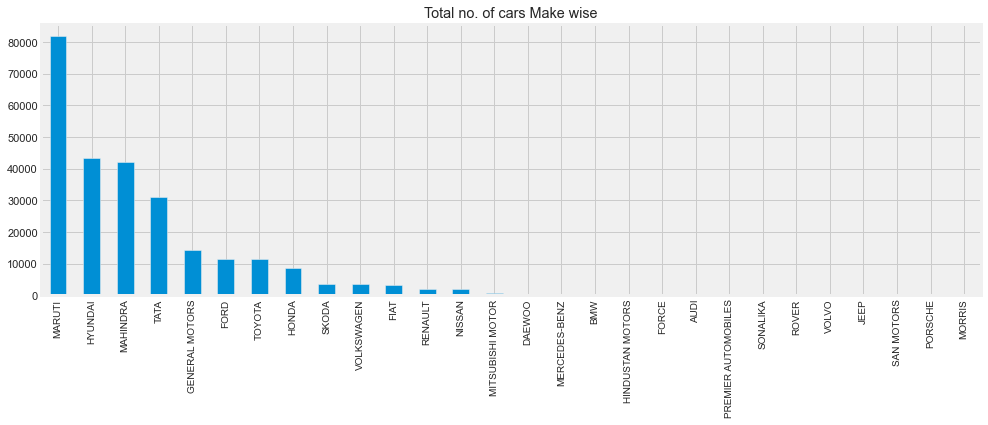

In [131]:
#Which make/car is more popular?
total_cars = df_car_regn['Make'].value_counts() 
plot = total_cars.plot(kind='bar', title = "Total no. of cars Make wise", figsize=(15,5))
plt.xticks(fontsize =10 , rotation=90);

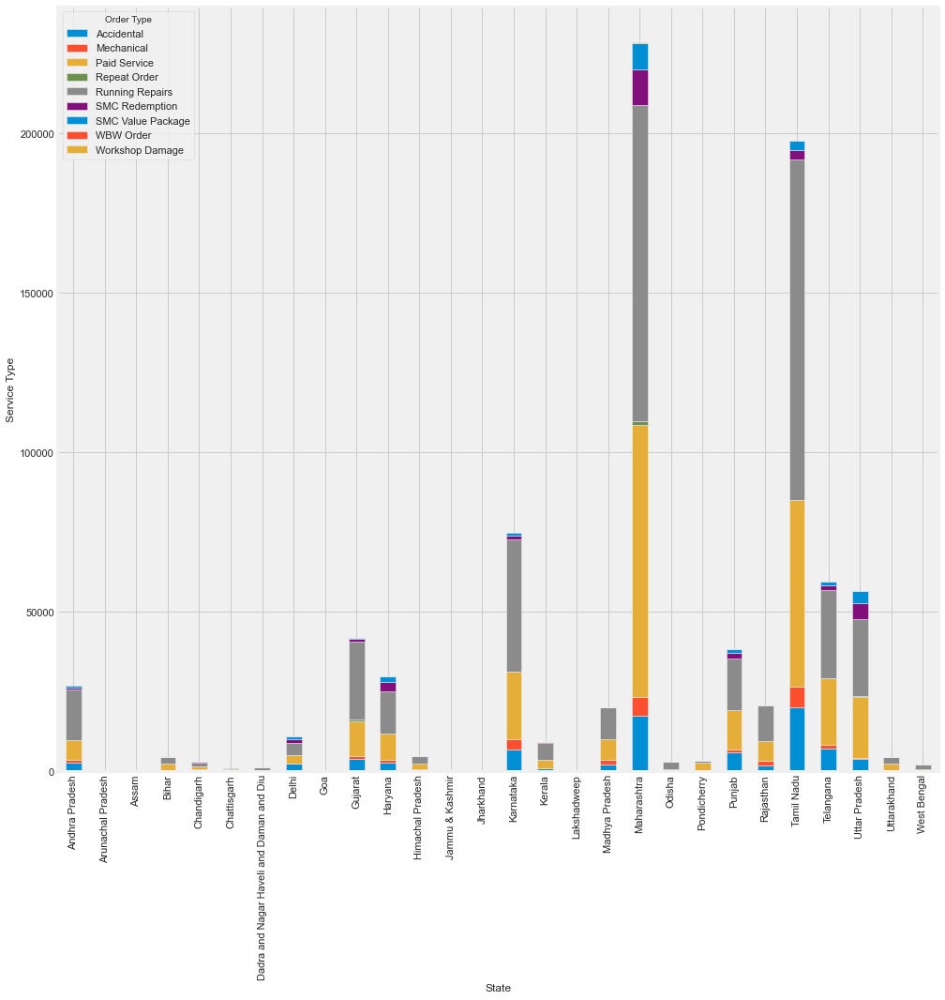

In [132]:
#Which type of service is popular in a certain area?
res = invoice_customer_jtd.groupby(['Clean_District','Order Type']).size().unstack()
#print(res)
# Plot stacked bar chart
res.plot(kind='bar', stacked=True, figsize=(15,15))
plt.xlabel('State')
plt.ylabel('Service Type')
# Display plot
plt.show()

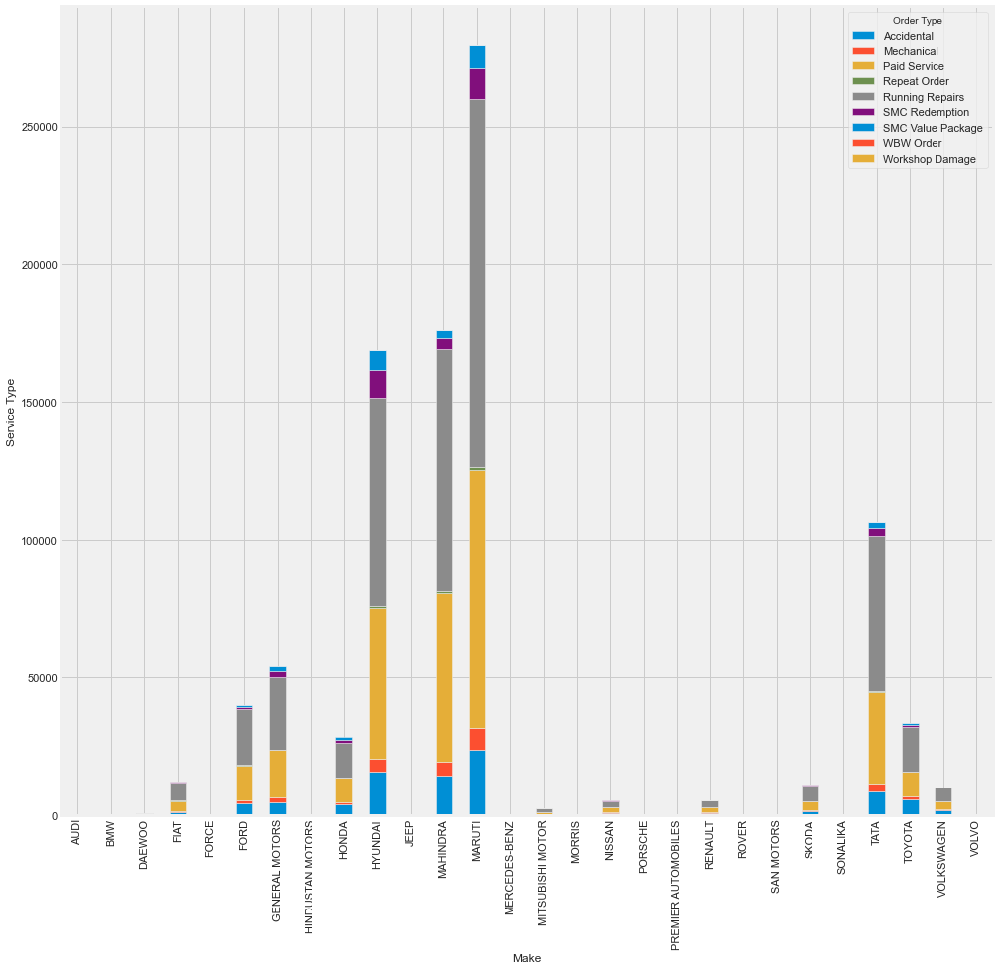

In [133]:
#What is service structure for particular make/car?
res = invoice_customer_jtd.groupby(['Make','Order Type']).size().unstack()
#print(res)
# Plot stacked bar chart
res.plot(kind='bar', stacked=True, figsize=(15,15))
plt.ylabel('Service Type')
plt.xlabel('Make')
# Display plot
plt.show()

In [134]:
invoice_customer_jtd['Total'] = invoice_customer_jtd['Labour Total'] + invoice_customer_jtd['Misc Total'] + invoice_customer_jtd['OSL Total'] + invoice_customer_jtd['Parts Total']

In [135]:
#Define function to make pivot_table and bar graph
def make_pivot_bar(dataframe, index, values, aggfunc, graph_type, color):
    global pivot_table
    pivot_table = pd.pivot_table(data = dataframe, index = index, values = values,
                                 aggfunc = aggfunc).reset_index().sort_values(by = values, ascending = False)
    fig = px.bar(pivot_table, x = pivot_table[index], y = pivot_table[values], color = color)
    title = "{} Amount spent by {}.".format(graph_type,index)
    fig.update_layout(title = title, width = 1000, height = 900)
    fig.show()

In [137]:
#Bar graph for total amount spent by make
# make_pivot_bar(invoice_customer_jtd, 'Make', 'Total', 'sum', 'Total', 'Total')

In [ ]:
#Bar graph for total amount spent by district
make_pivot_bar(invoice_customer_jtd, 'Clean_District', 'Total', 'sum', 'Total', 'Total')

In [ ]:
#Bar graph for average amount spent by district
make_pivot_bar(invoice_customer_jtd, 'Clean_District', 'Total', np.mean, 'Average', 'Total')

In [ ]:
#Bar graph for average amount spent by make
make_pivot_bar(invoice_customer_jtd, 'Make', 'Total', np.mean, 'Average', 'Total')

In [138]:
#Define function to make pivot_table and bar graph for top 'n' values
def make_pivot_bar_top(dataframe, index, values, aggfunc, n, color):
    global pivot_table
    pivot_table = pd.pivot_table(data = dataframe, index = index, values = values,
                                 aggfunc = aggfunc).reset_index().sort_values(by = values, ascending = False)
    pivot_table = pivot_table.head(n)
    fig = px.bar(pivot_table, x = pivot_table[index], y = pivot_table[values], color = color)
    title = "Most profitable {}.".format(index)
    fig.update_layout(title = title, width = 1000, height = 900)
    fig.show()

In [ ]:
#Most profitable model
make_pivot_bar_top(invoice_customer_jtd, 'Model', 'Total', np.mean, 20, 'Total')

In [ ]:
#Most profitable Plant
make_pivot_bar_top(invoice_customer_jtd, 'Clean_CITY', 'Total', np.mean, 20, 'Total')

In [ ]:
#Most profitable order type
make_pivot_bar_top(invoice_customer_jtd, 'Order Type', 'Total', np.mean, 20, 'Total')

In [ ]:
#Most profitable customer type
make_pivot_bar_top(invoice_customer_jtd, 'Cust Type', 'Total', np.mean, 20, 'Total')

In [139]:
#Make column to determine age of the car
average_yearly_km = 10000
invoice_customer_jtd['car_age'] = invoice_customer_jtd['KMs Reading']//average_yearly_km

In [140]:
#Make bins for KMs travelled
invoice_customer_jtd['km_bins'] = pd.cut(x=invoice_customer_jtd['KMs Reading'], bins=[0, 10000, 20000, 50000, 100000, 200000, 500000, np.inf],
                      labels = ['0 - 10000', '10000 - 20000', '20000 - 50000', '50000 - 100000', '100000 - 200000',
                                '200000 - 500000', '>500000'])

In [ ]:
#Bar graph for total amount spent by make
make_pivot_bar(invoice_customer_jtd, 'km_bins', 'Total', np.mean, 20, 'Total')

In [141]:
#Define function to make pivot_table and bar graph for top 'n' values ascending
def make_pivot_bar_top_garage(dataframe, index, values, aggfunc, n, color):
    global pivot_table
    pivot_table = pd.pivot_table(data = dataframe, index = index, values = values,
                                 aggfunc = aggfunc).reset_index().sort_values(by = values, ascending = True)
    pivot_table = pivot_table[pivot_table[values] > 0]
    pivot_table = pivot_table.head(n)
    fig = px.bar(pivot_table, x = pivot_table[index], y = pivot_table[values], color = color)
    title = 'Efficieny of Service Delivery by Garage'.format(index)
    fig.update_layout(title = title, width = 1000, height = 900)
    fig.show()

In [142]:
invoice_customer_jtd.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity', 'Total_Expense', 'Total', 'car_age',
       'km_bins'],
      dtype='object')

In [143]:
invoice_customer_jtd['service_time_hours'] = invoice_customer_jtd['Service_Time'].apply(lambda x: round(x/np.timedelta64(1, 'h'),3))

#Convert service_time to days
invoice_customer_jtd['service_time_days'] = invoice_customer_jtd['Service_Time'].apply(lambda x: round(x/np.timedelta64(1, 'D'),0))



In [ ]:
make_pivot_bar_top_garage(invoice_customer_jtd, 'Clean_CITY', 'service_time_hours', np.mean, 20, 'service_time_hours')

In [144]:
#Define function to make pivot_table and bar graph for total amount spent by type
def make_pivot_bar_type(dataframe, index1, index2, values, aggfunc, color):
    global pivot_table
    pivot_table = pd.pivot_table(data = dataframe, index = [index1, index2], values = values,
                                 aggfunc = aggfunc).reset_index().sort_values(by = values, ascending = False)
    pivot_table = pivot_table[pivot_table[values] > 0]
    fig = px.bar(pivot_table, x = pivot_table[index1], y = pivot_table[values], color = color)
    title = 'Amount spent per {} for each {}.'.format(index2, index1)
    fig.update_layout(title = title, width = 1000, height = 900, barmode = 'stack', xaxis_type = 'category')
    fig.update_xaxes(tickangle=315)
    fig.show()

In [ ]:
make_pivot_bar_type(invoice_customer_jtd, 'km_bins', 'Order Type', 'Total', 'sum', 'Order Type')

In [ ]:
make_pivot_bar_type(invoice_customer_jtd, 'Clean_District', 'Order Type', 'Total', 'sum', 'Order Type')

In [ ]:
make_pivot_bar_type(invoice_customer_jtd, 'Clean_District', 'Make', 'Total', 'sum', 'Make')

In [145]:
#Define function for division
invoice_customer_jtd['labour_to_parts'] = round(invoice_customer_jtd['Labour Total']/invoice_customer_jtd['Parts Total'],3)
invoice_customer_jtd['labour_to_parts'] = invoice_customer_jtd['labour_to_parts'].replace(np.nan, 0)

In [146]:
#Make bins for labour to parts ratio
invoice_customer_jtd['ratio_bins'] = pd.cut(x=invoice_customer_jtd['labour_to_parts'], bins=[-np.inf, 1, np.inf],
                      labels = ['Unprofitable', 'Profitable'])

In [ ]:
#Show profitability of different order types
groupby = invoice_customer_jtd.groupby(by = ['Order Type', 'ratio_bins'])[['Order Type']].size().reset_index(name = 'count')
fig = px.bar(groupby, x = 'Order Type', y = 'count', color = 'ratio_bins')
title = 'Profitability of different order types.'
fig.update_layout(title = title, width = 1000, height = 900, barmode = 'stack')
fig.update_xaxes(tickangle=315)
fig.show()

In [ ]:
#Bar graph for average amount amount spend on labour by district
make_pivot_bar(invoice_customer_jtd, 'Clean_District', 'Labour Total', np.mean, 'Average', 'Labour Total')

In [ ]:
#Bar graph for average amount amount spend on labour by district
make_pivot_bar(invoice_customer_jtd, 'Clean_District', 'Parts Total', np.mean, 'Average', 'Parts Total')

In [ ]:
#Extract month column from JobCardDate
invoice_customer_jtd['repair month'] = pd.DatetimeIndex(invoice_customer_jtd['JobCard_DateTime']).month

In [ ]:
#Make bar chart of order types by month of the year
make_pivot_bar_type(invoice_customer_jtd, 'repair month', 'Order Type', 'Total', 'sum', 'Order Type')

In [ ]:
#Make bar chart of order types by month of the year
make_pivot_bar_type(invoice_customer_jtd, 'Make', 'Clean_District', 'Total', 'sum', 'Clean_District')

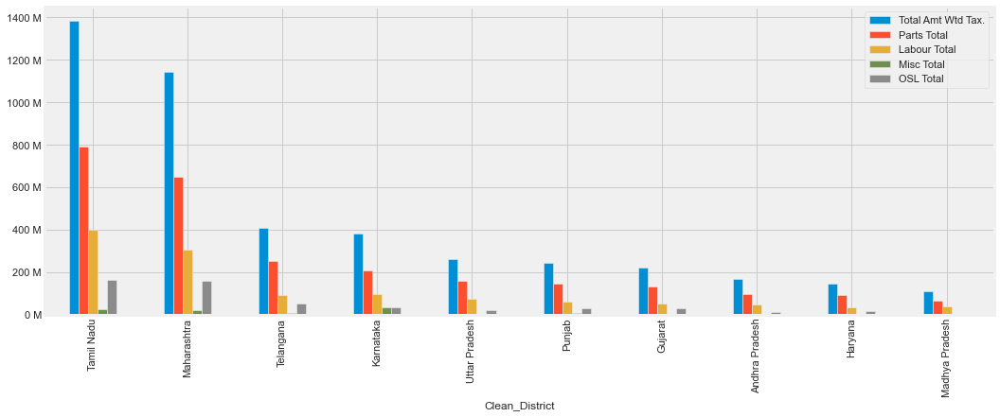

In [147]:
(invoice_customer_jtd.groupby(by="Clean_District")["Total Amt Wtd Tax.", "Parts Total", "Labour Total", "Misc Total", "OSL Total"].sum()/1000000).sort_values("Total Amt Wtd Tax.", ascending=False).iloc[:10].plot(kind="bar", figsize=(16,6))
y = plt.yticks()[0][:-1]
plt.yticks(y, [str(i)[:-2]+" M" for i in y])
plt.show()

In [149]:
amt_order = pd.DataFrame(invoice_customer_jtd.groupby("Order Type")["Total Amt Wtd Tax."].sum())
amt_order

,Total Amt Wtd Tax.
Order Type,
Accidental,1806597267
Mechanical,108944506
Paid Service,1699626399
Repeat Order,7972
Running Repairs,1689052768
SMC Redemption,4309451
SMC Value Package,101487571
WBW Order,297357
Workshop Damage,0


In [ ]:
px.bar(
    amt_order.sort_values("Total Amt Wtd Tax.", ascending=False)["Total Amt Wtd Tax."][:5].reset_index(),
    x="Order Type",
    y="Total Amt Wtd Tax.",
    template="plotly_white",
    title={
#         "text" : "Top Order Types",
#         "x" : 0.5,
#         "y" : 0.85
    },
    labels={
        "Total Amt Wtd Tax." : "Total Revenue"
    }
)

In [150]:
#Make histogram of service time taken
df=invoice_customer_jtd
def make_histogram(max_hours, column):
    df_hist = df[(df[column] > 0) & (df[column] < max_hours)]

    fig = px.histogram(df_hist, x = df_hist[column], histnorm = 'probability density')
    fig.update_layout(title = 'Histogram of service time taken',
                 xaxis_title = 'Service Time Taken')
    fig.show()
    
#Make histogram
# make_histogram(200, 'service_time_hours')

In [151]:
#Make Histogram
# make_histogram(500, 'service_time_days')

In [152]:
df['service_time_days'].value_counts()

0.0      426542
1.0      162929
2.0       88197
3.0       53528
4.0       35840
          ...  
352.0         1
242.0         1
362.0         1
393.0         1
360.0         1
Name: service_time_days, Length: 311, dtype: int64

In [ ]:
# Plant_master Visualisation

In [153]:
plant_master = pd.read_excel("Plant Master.xlsx")

In [154]:
plant_master.head()

,Plant,Name 1,Valuation Area,Customer no. - plant,Vendor number plant,Factory calendar,Name 2,House number and street,PO Box,Postal Code,City,Sales organization,State
0,BC07,NERKUNDRAM,BC07,PLBC07,PLBC07,IN,NaN,"No.117 Poonamallee High Road,",600107.0,600107,Chennai,MFCS,Tamil Nadu
1,BC30,SAS NAGAR - MOHALI,BC30,PLBC30,PLBC30,IN,NaN,"C-118, Phase 07,",160055.0,160055,Mohali,MFCS,Punjab
2,X001,X001 - AUTO PLANET WHEELS,X001,PLX001,NaN,IN,Thane,"Unit No.3, Kothari Compound,",400610.0,400610,Thane,MFCA,Maharashtra
3,X002,X002 - BHANDARI INDUSTRIES PVT,X002,PLX002,NaN,IN,Ghaziabad,"18/1, C Site 4, Sahibabad",201010.0,201010,Ghaziabad,MFCA,Uttar Pradesh
4,X003,X003 - Om Sri Satya Sai Automo,X003,PLX003,NaN,IN,Bengaluru,"#75, Sy.No. 83/2, Panathur Mai",560087.0,560087,Bengaluru,MFCB,Karnataka


In [155]:
plant_master.shape

(438, 13)

In [156]:
plant_master.isnull().sum()

Plant                        0
Name 1                       0
Valuation Area               0
Customer no. - plant         0
Vendor number plant        436
Factory calendar             0
Name 2                       2
House number and street      2
PO Box                       1
Postal Code                  0
City                         0
Sales organization           5
State                        0
dtype: int64

In [157]:
plant_data = plant_master.drop(columns=['Vendor number plant',
                                      'Factory calendar', 'Name 2', 'House number and street',
                                      'PO Box','Postal Code','Sales organization'])

In [158]:
plant_data.head()

,Plant,Name 1,Valuation Area,Customer no. - plant,City,State
0,BC07,NERKUNDRAM,BC07,PLBC07,Chennai,Tamil Nadu
1,BC30,SAS NAGAR - MOHALI,BC30,PLBC30,Mohali,Punjab
2,X001,X001 - AUTO PLANET WHEELS,X001,PLX001,Thane,Maharashtra
3,X002,X002 - BHANDARI INDUSTRIES PVT,X002,PLX002,Ghaziabad,Uttar Pradesh
4,X003,X003 - Om Sri Satya Sai Automo,X003,PLX003,Bengaluru,Karnataka


In [159]:
plant_data.isnull().sum()

Plant                   0
Name 1                  0
Valuation Area          0
Customer no. - plant    0
City                    0
State                   0
dtype: int64

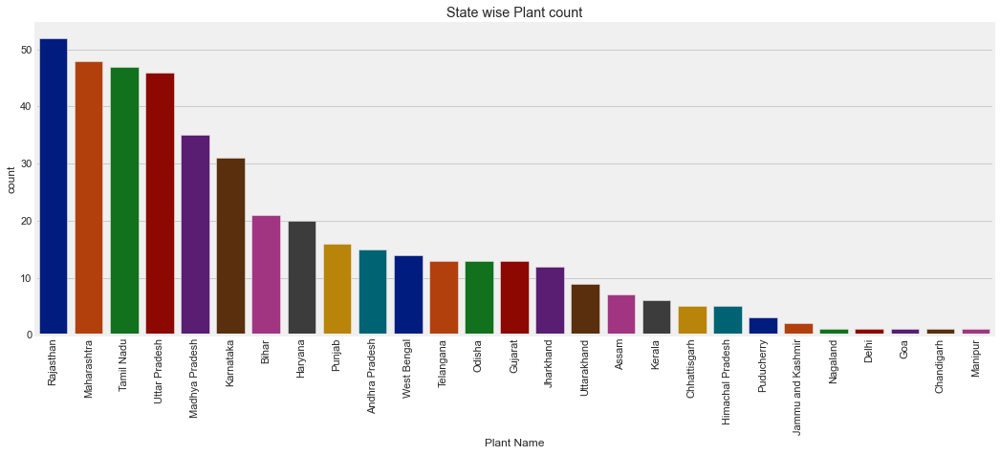

In [160]:
fig, ax = plt.subplots(figsize=(16,6))
plant_spred = plant_data[["Plant", "State"]].drop_duplicates()
sns.countplot(x = "State", data=plant_spred, ax=ax, order=plant_spred["State"].value_counts().index, saturation=1, palette="dark")
plt.xticks(rotation="90")
plt.title("State wise Plant count")
plt.xlabel("Plant Name")
plt.show()

In [161]:
Plants_counts = pd.merge(plant_master, invoice_customer_jtd, how ='inner', on ='Plant')

In [162]:
state_names = list(plant_master["State"].unique())

In [163]:
make_df = pd.DataFrame()
for State in state_names:
   
    make_df_tmp = pd.DataFrame({"State":State,"count":Plants_counts['Make'][Plants_counts.State==State].value_counts()} )
    make_df_tmp.reset_index(level=0, inplace=True)
    make_df_tmp.rename(columns={"index":"Make"},inplace=True)
    
    make_df = make_df.append(make_df_tmp)

make_df.reset_index(drop=True)

,Make,State,count
0,MARUTI,Tamil Nadu,35686
1,MAHINDRA,Tamil Nadu,34967
2,HYUNDAI,Tamil Nadu,25144
3,TATA,Tamil Nadu,22994
4,FORD,Tamil Nadu,9429
...,...,...,...
418,TATA,Assam,7
419,FORD,Assam,5
420,GENERAL MOTORS,Assam,4
421,HONDA,Assam,2


In [164]:
make_df.columns

Index(['Make', 'State', 'count'], dtype='object')

Car Make count for Tamil Nadu


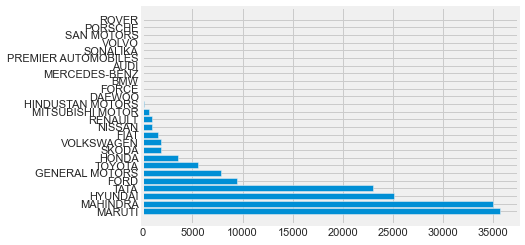

Car Make count for Punjab


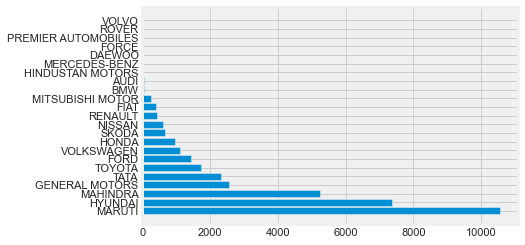

Car Make count for Maharashtra


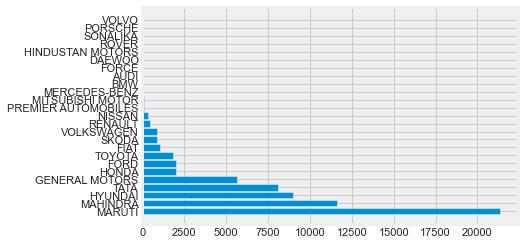

Car Make count for Uttar Pradesh


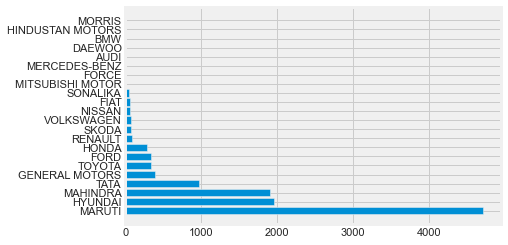

Car Make count for Karnataka


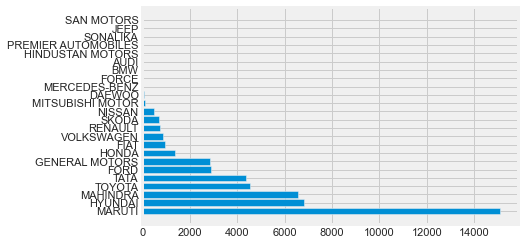

Car Make count for Puducherry


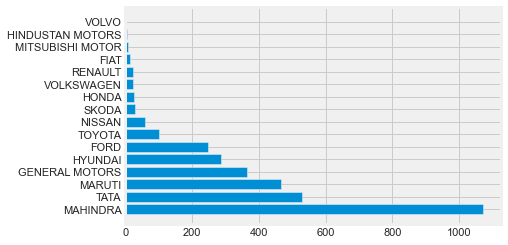

Car Make count for Andhra Pradesh


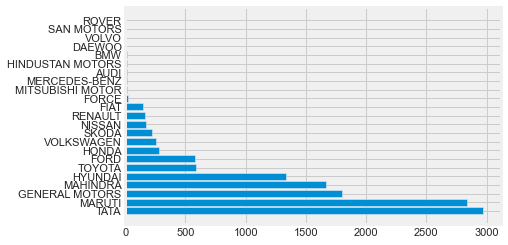

Car Make count for Chhattisgarh


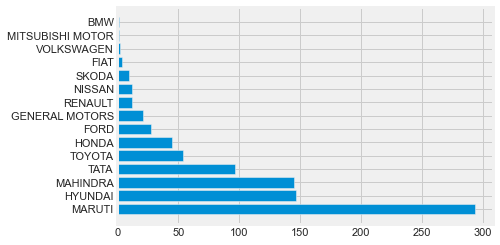

Car Make count for Haryana


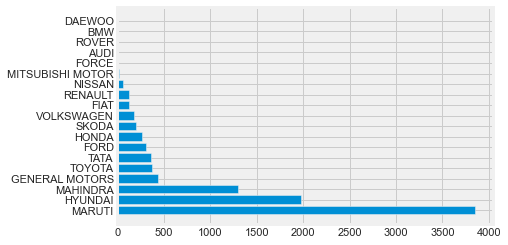

Car Make count for Madhya Pradesh


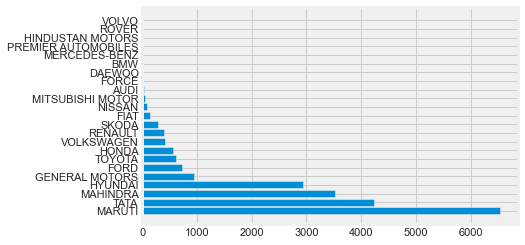

Car Make count for Uttarakhand


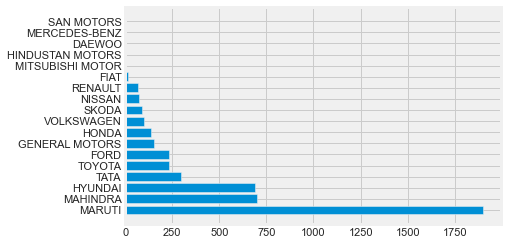

Car Make count for Kerala


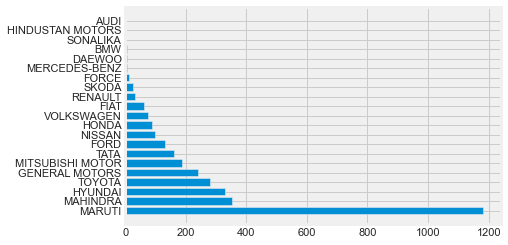

Car Make count for Telangana


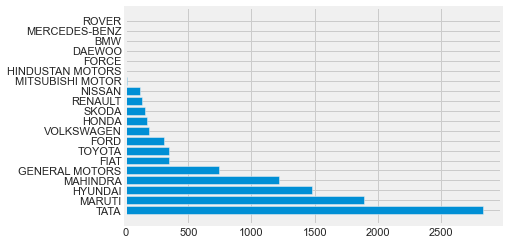

Car Make count for Himachal Pradesh


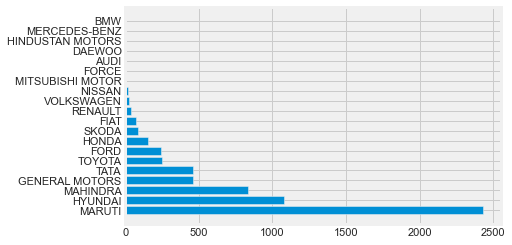

Car Make count for Rajasthan


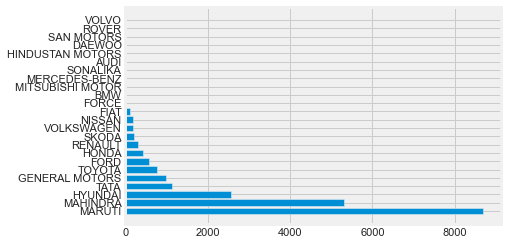

Car Make count for Bihar


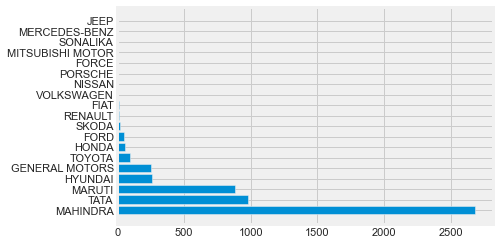

Car Make count for Chandigarh


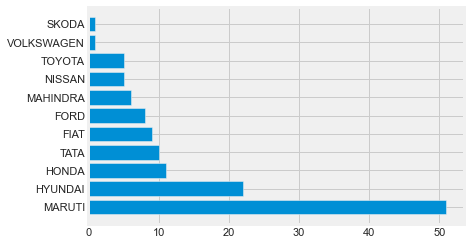

Car Make count for West Bengal


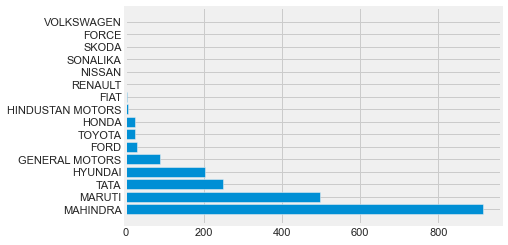

Car Make count for Odisha


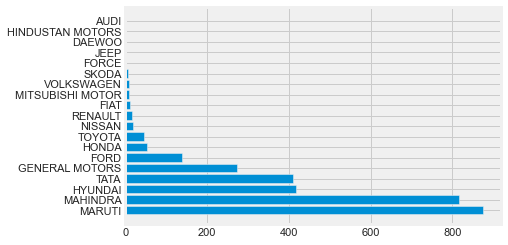

Car Make count for Gujarat


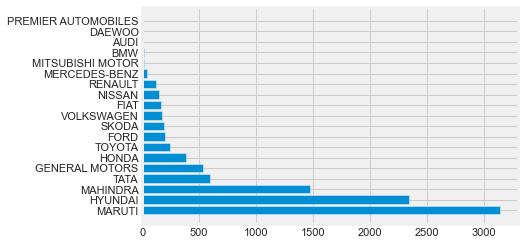

Car Make count for Goa


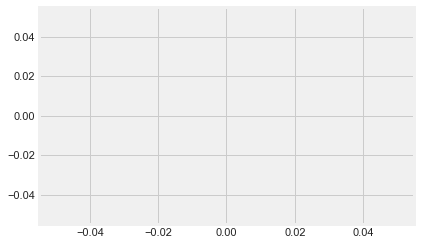

Car Make count for Jharkhand


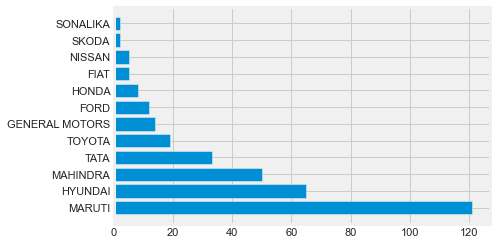

Car Make count for Assam


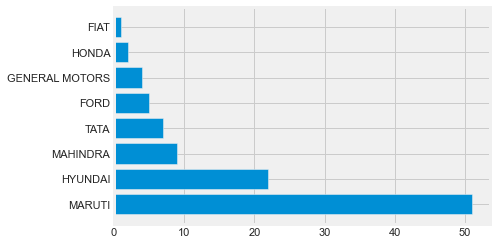

Car Make count for Manipur


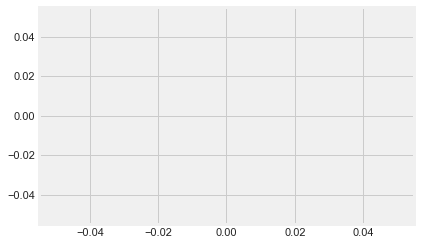

Car Make count for Jammu and Kashmir


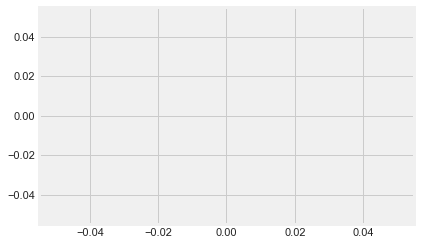

Car Make count for Nagaland


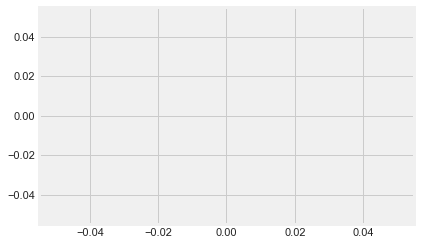

Car Make count for Delhi


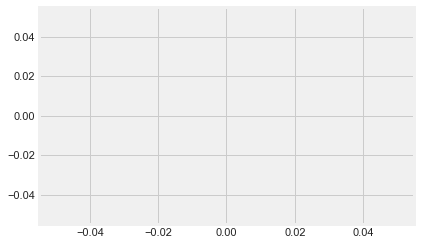

In [165]:
for state in state_names:
    make_names = list(make_df[make_df['State']==state]['Make'])
    plt.barh(make_names,make_df[make_df['State']==state]['count'])
    print("Car Make count for",state)
    
    plt.show()

In [166]:
service_df = pd.DataFrame()
for State in state_names:
    
    service_df_tmp = pd.DataFrame({"State":State,"count":Plants_counts['Order Type'][Plants_counts.State==State].value_counts()} )
    
    service_df_tmp.reset_index(level=0, inplace=True)
    service_df_tmp.rename(columns={"index":"service_type"},inplace=True)
   
    service_df = service_df.append(service_df_tmp)

service_df.reset_index(drop=True)

,service_type,State,count
0,Running Repairs,Tamil Nadu,87684
1,Paid Service,Tamil Nadu,41953
2,Accidental,Tamil Nadu,13732
3,Mechanical,Tamil Nadu,6670
4,SMC Redemption,Tamil Nadu,1797
...,...,...,...
120,Paid Service,Jharkhand,105
121,Accidental,Jharkhand,12
122,Paid Service,Assam,85
123,Running Repairs,Assam,10


Service order type wise count for  Tamil Nadu


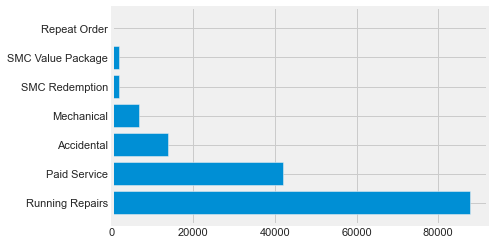

Service order type wise count for  Punjab


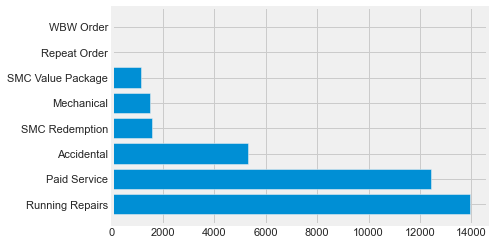

Service order type wise count for  Maharashtra


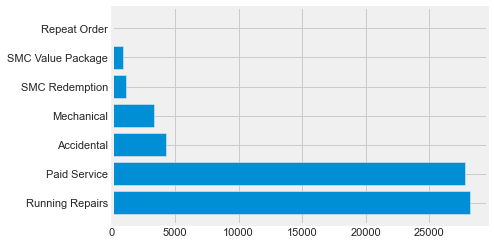

Service order type wise count for  Uttar Pradesh


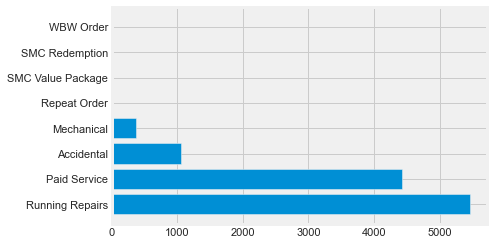

Service order type wise count for  Karnataka


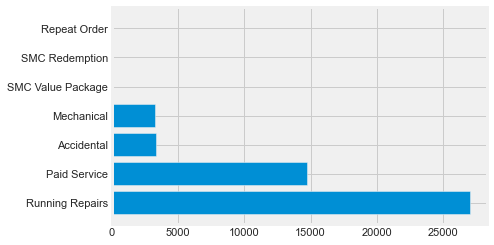

Service order type wise count for  Puducherry


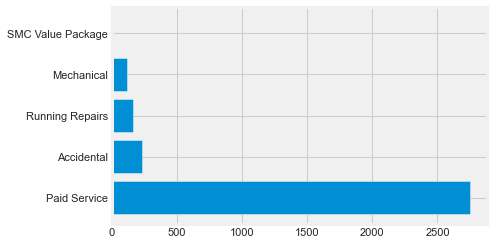

Service order type wise count for  Andhra Pradesh


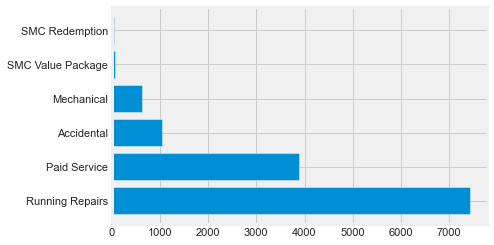

Service order type wise count for  Chhattisgarh


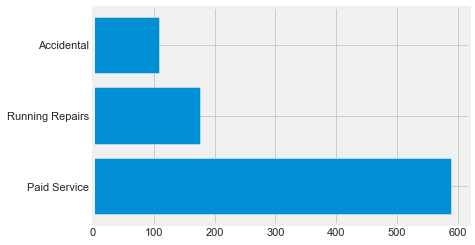

Service order type wise count for  Haryana


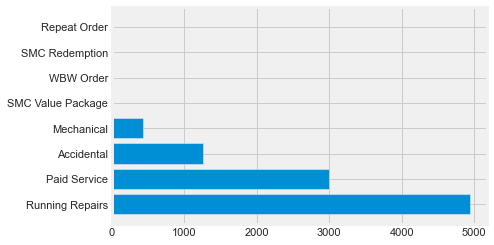

Service order type wise count for  Madhya Pradesh


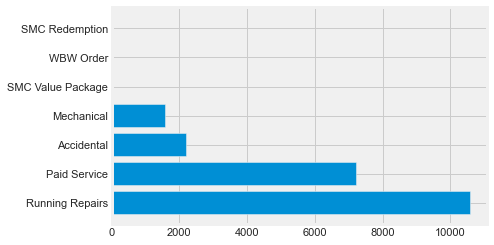

Service order type wise count for  Uttarakhand


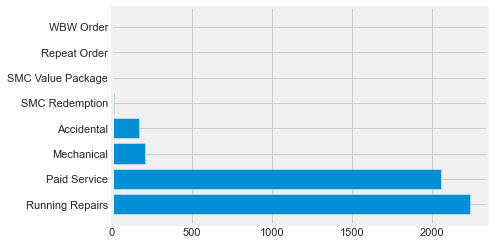

Service order type wise count for  Kerala


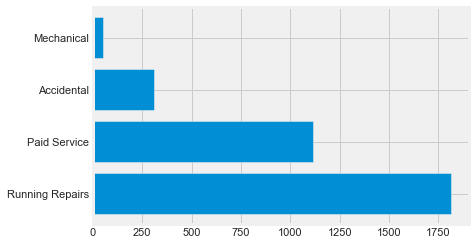

Service order type wise count for  Telangana


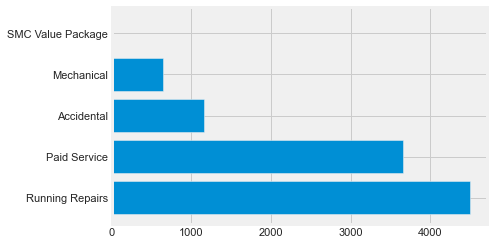

Service order type wise count for  Himachal Pradesh


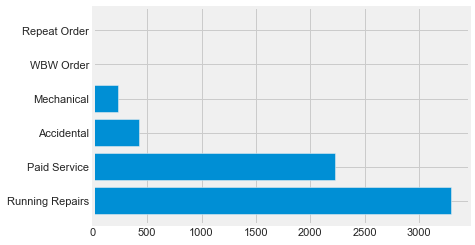

Service order type wise count for  Rajasthan


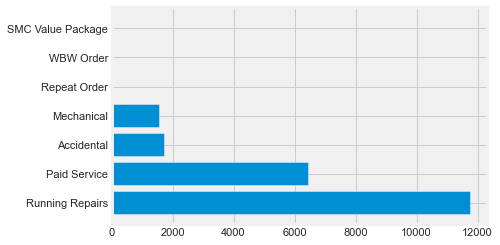

Service order type wise count for  Bihar


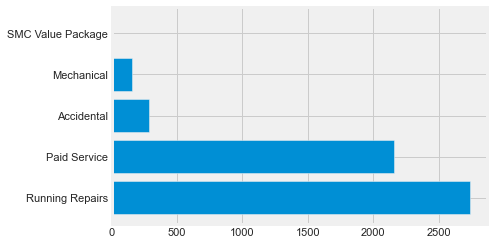

Service order type wise count for  Chandigarh


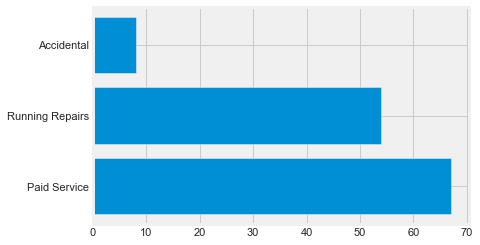

Service order type wise count for  West Bengal


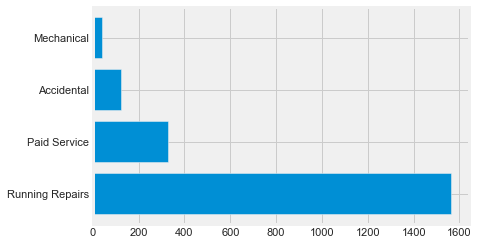

Service order type wise count for  Odisha


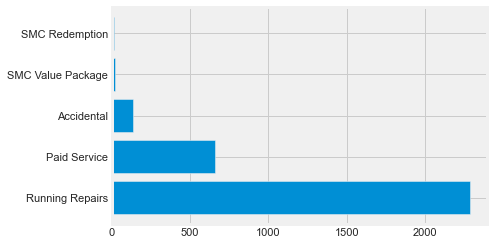

Service order type wise count for  Gujarat


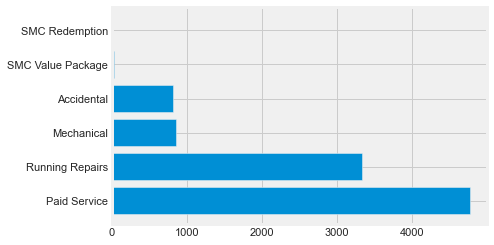

Service order type wise count for  Goa


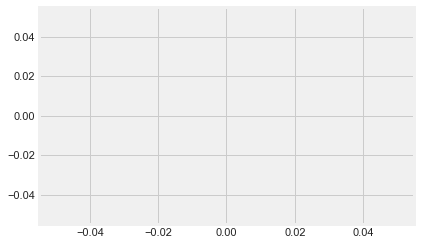

Service order type wise count for  Jharkhand


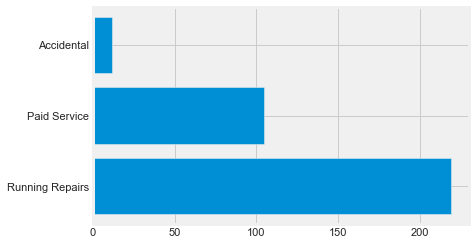

Service order type wise count for  Assam


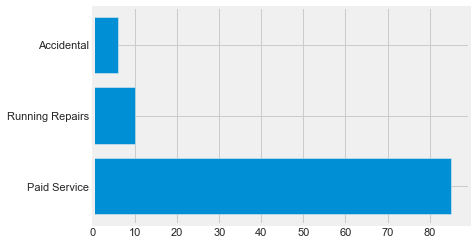

Service order type wise count for  Manipur


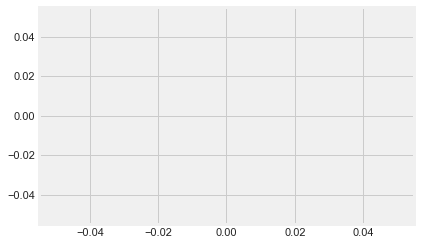

Service order type wise count for  Jammu and Kashmir


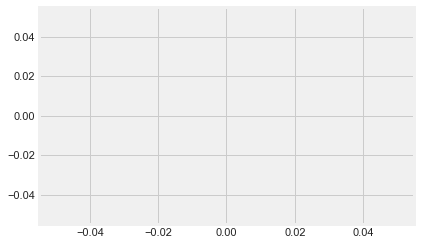

Service order type wise count for  Nagaland


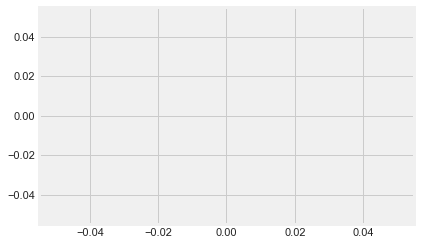

Service order type wise count for  Delhi


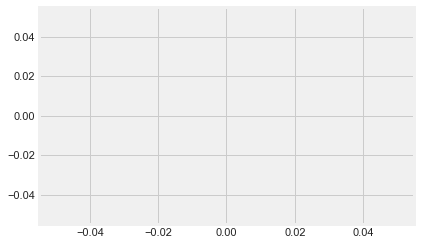

In [167]:
for state in state_names:
    service_names = list(service_df[service_df['State']==state]['service_type'])
    plt.barh(service_names,service_df[service_df['State']==state]['count'])
    print("Service order type wise count for ",state)
    
    plt.show()

<BarContainer object of 8 artists>

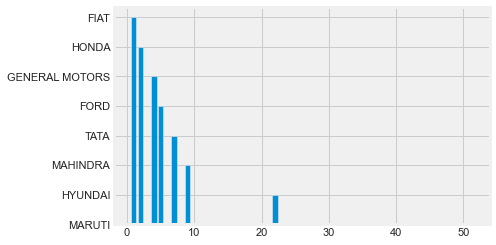

In [168]:
make_names = list(make_df[make_df['State']=="Assam"]['Make'])
plt.bar(make_df[make_df['State']=="Assam"]['count'],make_names)

In [169]:
invoice_new=invoice_customer_jtd

In [172]:
inv_income = invoice_new.groupby(["Year", "Month"])["Total Amt Wtd Tax."].sum().reset_index()
plot_data = []
for yr in inv_income["Year"].unique():
    pl_dt = go.Scatter(
        x = inv_income[inv_income["Year"]==yr]["Month"],
        y = inv_income[inv_income["Year"]==yr]["Total Amt Wtd Tax."],
        name = str(yr),
    )
    plot_data.append(pl_dt)

plot_layout = go.Layout(
    xaxis = dict(tickmode = 'linear', 
             tick0 = 1,
             dtick = 1,
            title = "Month"),
    title = {
        "text" : "Monthly Revenue",
        "x" : 0.5,
        "y" : 0.85
    },
    yaxis={
        "title" : "Revenue"
    },
    template="plotly_white"
)
fig = go.Figure(data=plot_data, layout=plot_layout)
plt.show()
pyoff.iplot(fig)
# save_fig(fig, name="Monthly Revenue Hist")

In [173]:
invoice_new["DayOfWeek"] = invoice_new["Invoice_DateTime"].map(lambda date: date.dayofweek)

In [174]:
inv_income = invoice_new.groupby(["DayOfWeek"])["Total Amt Wtd Tax."].sum().reset_index()
plot_data = [
    go.Scatter(
        x = inv_income["DayOfWeek"],
        y = inv_income["Total Amt Wtd Tax."],
        name = "Total",
    )
]
inv_income = invoice_new.groupby(["Year", "DayOfWeek"])["Total Amt Wtd Tax."].sum().reset_index()
for yr in inv_income["Year"].unique():
    pt_dt = go.Scatter(
        x = inv_income[inv_income["Year"]==yr]["DayOfWeek"],
        y = inv_income[inv_income["Year"]==yr]["Total Amt Wtd Tax."],
        name = str(yr),
    )
    plot_data.append(pt_dt)

plot_layout = go.Layout(
    title = {
        "text" : "Weekly Revenue",
        "x" : 0.5,
        "y" : 0.85
    },
    yaxis={
        "title" : "Revenue"
    },
    xaxis={
        "title" : "Days"
    },
    template="plotly_white"
)

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [175]:
new_cust = invoice_new.groupby('Customer No.')["Invoice_DateTime"].min().reset_index()
new_cust = new_cust.rename(columns = {"Invoice_DateTime" : "FirstInvDate"})
invoice_new = pd.merge(invoice_new, new_cust, on="Customer No.")

In [176]:
invoice_new["UserType"] = "New"
invoice_new.loc[invoice_new["Invoice_DateTime"]>invoice_new["FirstInvDate"], "UserType"] = "Existing"
# invoice_new.loc[invoice_new["Invoice Date"]==invoice_new["LastInvDate"], "UserType"] = "Lost"

In [179]:
lost_cust = invoice_new.groupby('Customer No.')["Invoice_DateTime"].max().reset_index()
lost_cust = lost_cust.rename(columns = {"Invoice_DateTime" : "LastInvDate"})
invoice_new = pd.merge(invoice_new, lost_cust, on="Customer No.")
invoice_new

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,FirstInvDate,UserType,LastInvDate_x,LastInvDate_y
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P001,1203.14,73.0,6900.76,4051.95,4,20000 - 50000,477.015,20.0,0.512,Unprofitable,4,2014-08-14 17:54:30,Existing,2015-01-02 11:30:36,2015-01-02 11:30:36
1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P002,2348.75,6.5,6900.76,4051.95,4,20000 - 50000,477.015,20.0,0.512,Unprofitable,4,2014-08-14 17:54:30,Existing,2015-01-02 11:30:36,2015-01-02 11:30:36
2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P010,500.06,1.0,6900.76,4051.95,4,20000 - 50000,477.015,20.0,0.512,Unprofitable,4,2014-08-14 17:54:30,Existing,2015-01-02 11:30:36,2015-01-02 11:30:36
3,Retail,67849,00:00:00,7000137359,136482,45575,989.98,GENERAL MOTORS,0.00,SPARK,6249.87,Accidental,4230.25,400601,BC01,THANE,NO,0.0,KA19MA1291,11470,BC01FS1,2014-08-14 17:54:30,2014-08-08 15:26:53,6 days 02:27:37,2014,8,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,136482.0,P001,989.98,2000.0,21950.22,11470.10,4,20000 - 50000,146.460,6.0,0.234,Unprofitable,3,2014-08-14 17:54:30,New,2015-01-02 11:30:36,2015-01-02 11:30:36
4,Retail,67849,00:00:00,7000137359,136482,45575,989.98,GENERAL MOTORS,0.00,SPARK,6249.87,Accidental,4230.25,400601,BC01,THANE,NO,0.0,KA19MA1291,11470,BC01FS1,2014-08-14 17:54:30,2014-08-08 15:26:53,6 days 02:27:37,2014,8,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,136482.0,P002,4230.25,7.0,21950.22,11470.10,4,20000 - 50000,146.460,6.0,0.234,Unprofitable,3,2014-08-14 17:54:30,New,2015-01-02 11:30:36,2015-01-02 11:30:36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
936270,Retail,203844,00:00:00,7231000016,400150,100165,5063.08,MAHINDRA,0.00,XYLO,0.00,Paid Service,6989.06,600109,X405,X405 - NANGAN MOTORS PVT. LTD.,NO,0.0,TN22BW1485,12052,X405SA1,2016-06-30 14:30:23,2016-06-30 09:58:59,0 days 04:31:24,2016,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,400150.0,P002,6989.06,4.0,19041.20,12052.14,10,100000 - 200000,4.523,0.0,0.724,Unprofitable,3,2016-06-30 14:30:23,New,2016-06-30 14:30:23,2016-06-30 14:30:23
936271,Retail,203820,00:00:00,7231000017,400100,72546,2495.90,MARUTI,374.97,ALTO,0.00,Paid Service,1587.28,600058,X405,X405 - NANGAN MOTORS PVT. LTD.,NO,0.0,TN38Y9343,4458,X405SA1,2016-06-30 14:56:58,2016-06-30 09:15:12,0 days 05:41:46,2016,6,Tiruvallur,Tamil Nadu,"Ambattur Indl Estate, Athipattu",13.0252,79.8562,NaN,NaN,NaN,400100.0,P001,2495.90,146.0,6420.40,4458.15,7,50000 - 100000,5.696,0.0,1.572,Profitable,3,2016-06-30

In [180]:
# one_time_cust = invoice_new[invoice_new["FirstInvDate"] == invoice_new["LastInvDate"]].groupby("YearMon").size().reset_index()

In [ ]:
mon_user_count = invoice_new.groupby(["YearMon", "UserType"]).size().reset_index()

plot_data = [
    go.Scatter(
        x = mon_user_count[mon_user_count["UserType"] == "New"]["YearMon"],
        y = mon_user_count[mon_user_count["UserType"] == "New"][0],
        name = "New",
    ),
    go.Scatter(
        x = mon_user_count[mon_user_count["UserType"] == "Existing"]["YearMon"],
        y = mon_user_count[mon_user_count["UserType"] == "Existing"][0],
        name = "Existing",
    ),
    go.Scatter(
        x = mon_user_count[mon_user_count["UserType"] == "Lost"]["YearMon"],
        y = mon_user_count[mon_user_count["UserType"] == "Lost"][0],
        name = "Lost",
    ),
    go.Scatter(
        x = one_time_cust["YearMon"],
        y = one_time_cust[0],
        name = "One-Time",
    )
]

plot_layout = go.Layout(
    title = {
        "text" : "New/Existing/One Timers Counts",
        "x" : 0.5,
        "y" : 0.85
    },
    xaxis={
        "type": "category",
        "title" : "YYYYMM"
    },
    yaxis={
        "title" : "Count"
    },
    template="plotly_white"
)

fig = go.Figure(plot_data, plot_layout)
pyoff.iplot(fig)

In [181]:
def city_cat(city):
    X = ['ahmedabad', 'bangalore', 'chennai', 'delhi', 'hyderabad', 'kolkata', 'mumbai', 'pune','thane']
    Y = ['agra', 'ajmer', 'aligarh', 'amravati', 'amritsar', 'asansol', 'aurangabad', 'bareilly', 'belgaum', 'bhavnagar', 'bhiwandi', 'bhopal', 'bhubaneswar', 'bikaner', 'bilaspur', 'bokaro', 'bokaro steel city', 'chandigarh', 'coimbatore', 'cuttack', 'dehradun', 'dhanbad', 'bhilai', 'durgapur', 'erode', 'faridabad', 'firozabad', 'ghaziabad', 'gorakhpur', 'gulbarga', 'guntur', 'gwalior', 'gurgaon', 'guwahati', 'hamirpur', 'hubli', 'dharwad', 'hubli dharwad', 'hubli–dharwad', 'indore', 'jabalpur', 'jaipur', 'jalandhar', 'jammu', 'jamnagar', 'jamshedpur', 'jhansi', 'jodhpur', 'kakinada', 'kannur', 'kanpur', 'kochi', 'kolhapur', 'kollam', 'kozhikode', 'kurnool', 'ludhiana', 'lucknow', 'madurai', 'malappuram', 'mathura', 'goa', 'mangalore', 'meerut', 'moradabad', 'mysore', 'nagpur', 'nanded', 'nashik', 'nellore', 'noida', 'patna', 'pondicherry', 'purulia prayagraj', 'raipur', 'rajkot', 'rajahmundry', 'ranchi', 'rourkela', 'salem', 'sangli', 'shimla', 'siliguri', 'solapur', 'srinagar', 'surat', 'thiruvananthapuram', 'thrissur', 'tiruchirappalli', 'tiruppur', 'ujjain', 'bijapur', 'vadodara', 'varanasi', 'virar', 'vasai', 'vasai virar', 'vasai-virar', 'vasai-virar city', 'vijayawada', 'visakhapatnam', 'vellore', 'warangal']
    
    if city in X:
        return 'x'
    elif city in Y:
        return 'y'
    else:
        return 'z'

In [182]:
invoice_customer_jtd["CityCategory"] = invoice_customer_jtd["Clean_CITY"].str.lower().apply(city_cat)

In [183]:
invoice_customer_jtd["CityCategory"].value_counts()

z    412055
y    297184
x    227036
Name: CityCategory, dtype: int64

In [184]:
def drill_down_reports(df,group_list,cal_col,cal_type,title):
    '''df = DataFrame
       group_list = list of columns on groupby needs to be done.
       cal_col = name of metric column.
       cal_type = type of metric operation which needs be performed i.e. Frequency or Amount
    '''
    
    if cal_type == 'Frequency':
        df_scc = df.groupby(group_list)[cal_col].count().reset_index()
    elif cal_type == 'Amount':
        df_scc = df.groupby(group_list)[cal_col].sum().reset_index()
    else:
        return 'Could not understand cal_type'
    df_scc.rename({cal_col:cal_type},axis=1,inplace=True)

    fig = px.sunburst(df_scc, path=group_list, values=cal_type,color=cal_type,color_continuous_scale='RdBu')
    fig.update_layout(
        title=title,
        margin=dict(
            l=50,
            r=50,
            b=50,
            t=50    ),
        font=dict(
            family="Courier New, monospace",
            size=18,
            color="#7f7f7f"
        ),
        paper_bgcolor="LightSteelBlue",

        yaxis=dict(titlefont=dict(size=30)
        )
    )
    fig.update_yaxes(automargin=True)


    fig.show()    

In [186]:
# Visualization
#State Wise Map
# drill_down_reports(invoice_customer_jtd,['Clean_District','CityCategory','Clean_CITY'],'Customer No.','Frequency',"Demographic Distribution of Invoice")

In [ ]:
#Demo & Make-Model
# drill_down_reports(invoice_customer_jtd,['Clean_District','Make','Model'],'Customer No.','Frequency',"Demographic & Make-Model Distribution of Invoice ")

In [187]:
df1=df
df1=df1.dropna()

In [ ]:
#Define function to calculate total amount and service time taken
def make_scatter(column):
    df_scatter = df1[df1[column] > 0]
    fig = px.scatter(df_scatter, x = 'Total Amt Wtd Tax.', y = "service_time_days", color = 'Make', log_x=True, 
                     range_x=[1000,100000], range_y=[-20,120],size="Order Quantity",size_max=60,hover_name='Order Type',
                     animation_frame='Month',animation_group='Order Type')
    
    fig.update_layout(title = 'Scatterplot of Service time taken and Total amount paid',
                 xaxis_title = 'Total Amount Paid by Customer',
                     yaxis_title = 'Service Time Taken')
    fig.show()
    
#Make scatterplot
make_scatter('service_time_days')

In [188]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [189]:
import cufflinks as cf

In [190]:
!pip install folium

In [191]:
# visualization
import matplotlib.pyplot as plt
import seaborn as sns
# import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap
import folium
import branca

In [192]:
df=invoice_customer_jtd.copy()
df=df.dropna()

In [193]:
dfs = df[df['Year'] == "2016"]

In [194]:
dfs.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
599112,Retail,E10724,16:12:42,7005202792,300505,50220,69.97,FIAT,0.0,PALIO,0.0,Running Repairs,297.65,400606,BC01,THANE,YES,0.0,MH04CT2685,367,BC01SA2,2016-01-02 15:57:28,2016-01-02 12:20:38,0 days 03:36:50,2016,1,Thane,Maharashtra,Jekegram,19.1941,73.0002,E10724,1.0,Z001,300505.0,P001,69.97,10.0,665.27,367.62,5,50000 - 100000,3.614,0.0,0.235,Unprofitable,5,x
599113,Retail,E10724,16:12:42,7005202792,300505,50220,69.97,FIAT,0.0,PALIO,0.0,Running Repairs,297.65,400606,BC01,THANE,YES,0.0,MH04CT2685,367,BC01SA2,2016-01-02 15:57:28,2016-01-02 12:20:38,0 days 03:36:50,2016,1,Thane,Maharashtra,Jekegram,19.1941,73.0002,E10724,1.0,Z001,300505.0,P002,297.65,2.0,665.27,367.62,5,50000 - 100000,3.614,0.0,0.235,Unprofitable,5,x
599166,Retail,E12042,13:41:29,7005202821,300448,89412,248.01,HONDA,100.0,CITY,6525.3,Accidental,0.00,400601,BC01,THANE,YES,0.0,MH04CM9988,6873,BC01SA2,2016-01-08 13:36:50,2016-01-02 11:54:23,6 days 01:42:27,2016,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,E12042,1.0,Z001,300448.0,P001,248.01,36.0,13498.61,6873.31,8,50000 - 100000,145.708,6.0,inf,Profitable,4,x
599167,Retail,E12042,13:41:29,7005202821,300448,89412,248.01,HONDA,100.0,CITY,6525.3,Accidental,0.00,400601,BC01,THANE,YES,0.0,MH04CM9988,6873,BC01SA2,2016-01-08 13:36:50,2016-01-02 11:54:23,6 days 01:42:27,2016,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,E12042,1.0,Z001,300448.0,P010,6525.30,3.0,13498.61,6873.31,8,50000 - 100000,145.708,6.0,inf,Profitable,4,x
599168,Retail,E12042,13:41:29,7005202821,300448,89412,248.01,HONDA,100.0,CITY,6525.3,Accidental,0.00,400601,BC01,THANE,YES,0.0,MH04CM9988,6873,BC01SA2,2016-01-08 13:36:50,2016-01-02 11:54:23,6 days 01:42:27,2016,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,E12042,1.0,Z001,300448.0,P011,100.00,1.0,13498.61,6873.31,8,50000 - 100000,145.708,6.0,inf,Profitable,4,x


In [195]:
dfs.shape

(1943, 48)

In [196]:
dfs1=dfs.groupby(["Clean_Location_Area","Clean_CITY","Clean_District","Plant",'latitude','longitude'],as_index=False).agg({"Total Amt Wtd Tax.":'sum',"Order Quantity":"sum"})

In [197]:
dfs1.head()

,Clean_Location_Area,Clean_CITY,Clean_District,Plant,latitude,longitude,Total Amt Wtd Tax.,Order Quantity
0,"Adgaon, Rasegaon, Madsangvi, Jambutke, Dari, C...",Nashik,Maharashtra,BC03,20.3255,74.328043,6672,430.00
1,"Adgaon, Rasegaon, Madsangvi, Jambutke, Dari, C...",Nashik,Maharashtra,X187,20.3255,74.328043,5944,11.50
2,"Airport (Pune), Vidyanagar (Pune), Iaf Station",Pune,Maharashtra,BC24,18.5333,73.866700,248,1.00
3,"Airport (Pune), Vidyanagar (Pune), Iaf Station",Pune,Maharashtra,BC34,18.5333,73.866700,0,6.10
4,"Alandi Devachi, Dhanore, Solu, Charoli BK, Mar...",Pune,Maharashtra,BC34,18.6776,73.923043,32808,126.51


In [198]:
dfs1.shape

(228, 8)

In [199]:
def fancy_html(row):
    i = row
    Total_revenue=dfs1['Total Amt Wtd Tax.'].iloc[i]
    City_name = dfs1['Clean_CITY'].iloc[i]                           
    State_name = dfs1['Clean_District'].iloc[i]
    Year = 2016                                           
    Location_name = dfs1['Clean_Location_Area'].iloc[i]                               
    Plant_name = dfs1['Plant'].iloc[i]   
    Order_Quantity = dfs1['Order Quantity'].iloc[i]

    left_col_colour = "#2A799C"
    right_col_colour = "#C5DCE7"
    
    html = """<!DOCTYPE html>
<html>

<head>
</head>
    <table style="height: 126px; width: 300px;">
<tbody>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">Total Revenue</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(Total_revenue) + """
</tr>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">State</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(State_name) + """
</tr>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">City</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(City_name) + """
</tr>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">Location Name</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(Location_name) + """
</tr>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">Order Quantity</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(Order_Quantity) + """
</tr>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">Plant Name</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(Plant_name) + """
</tr>
<tr>
<td style="background-color: """+ left_col_colour +""";"><span style="color: #ffffff;">Year of Service</span></td>
<td style="width: 200px;background-color: """+ right_col_colour +""";">{}</td>""".format(Year) + """
</tr>
</tbody>
</table>
</html>
"""
    return html

In [200]:
location = df['latitude'].mean(), df['longitude'].mean()
m = folium.Map(
    location=location,
    tiles='openstreetmap'
)

# Stamen Toner,Stamen Terrain,openstreetmap

sw = df[['latitude', 'longitude']].min().values.tolist()
ne = df[['latitude', 'longitude']].max().values.tolist()

m.fit_bounds([sw, ne]) 

for i in range(0,len(dfs1)):
    html = fancy_html(i)
 
    iframe = branca.element.IFrame(html=html,width=400,height=300)
    popup = folium.Popup(iframe,parse_html=True)
    
    folium.Marker([dfs1['latitude'].iloc[i],dfs1['longitude'].iloc[i]], tooltip=dfs1['Clean_CITY'].iloc[i],
                  popup=popup,icon=folium.Icon(color='blue', icon='info-sign')).add_to(m)

m

In [201]:
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()

In [202]:
dfy = df[df['Order Type']=='Paid Service'].reset_index()

In [203]:
dfy.shape

(13812, 49)

In [204]:
fig=dfy[['Labour Total','Misc Total','OSL Total','Parts Total','Total Amt Wtd Tax.','Month','Year']].reset_index().iplot(kind='spread')
fig

In [205]:
df.columns

Index(['Cust Type', 'Customer No.', 'Gate Pass Time', 'Invoice No',
       'Job Card No', 'KMs Reading', 'Labour Total', 'Make', 'Misc Total',
       'Model', 'OSL Total', 'Order Type', 'Parts Total', 'Pin code', 'Plant',
       'Plant Name1', 'Print Status', 'Recovrbl Exp', 'Regn No',
       'Total Amt Wtd Tax.', 'User ID', 'Invoice_DateTime', 'JobCard_DateTime',
       'Service_Time', 'Year', 'Month', 'Clean_CITY', 'Clean_District',
       'Clean_Location_Area', 'latitude', 'longitude', 'Business Partner',
       'Partner Type', 'Data Origin', 'DBM Order', 'Item Category',
       'Net value', 'Order Quantity', 'Total_Expense', 'Total', 'car_age',
       'km_bins', 'service_time_hours', 'service_time_days', 'labour_to_parts',
       'ratio_bins', 'DayOfWeek', 'CityCategory'],
      dtype='object')

In [206]:
df.shape

(30238, 48)

In [207]:
import plotly.graph_objects as go

import pandas as pd

# Load dataset
df=dfs

# Initialize figure
fig = go.Figure()

# Add Traces

fig.add_trace(
    go.Scatter(x=list(df.index),
               y=list(df['Total Amt Wtd Tax.']),
               name="Total Amt Wtd Tax.",
               line=dict(color="#33CFA5")))

fig.add_trace(
    go.Scatter(x=list(df.index),
               y=[df['Total Amt Wtd Tax.'].mean()] * len(df.index),
               name="Total Amt Wtd Tax. Average",
               visible=False,
               line=dict(color="#33CFA5", dash="dash")))

fig.add_trace(
    go.Scatter(x=list(df.index),
               y=list(df['Total_Expense']),
               name="Total_Expense",
               line=dict(color="#F06A6A")))

fig.add_trace(
    go.Scatter(x=list(df.index),
               y=[df['Total_Expense'].mean()] * len(df.index),
               name="Total_Expense Average",
               visible=False,
               line=dict(color="#F06A6A", dash="dash")))

# Add Annotations and Buttons
high_annotations = [dict(x="",
                         y=df['Total Amt Wtd Tax.'].mean(),
                         xref="x", yref="y",
                         text="Total Amt Wtd Tax. Average:<br> %.2f" % df['Total Amt Wtd Tax.'].mean(),
                         ax=0, ay=-40),
                    dict(x=df['Total Amt Wtd Tax.'].idxmax(),
                         y=df['Total Amt Wtd Tax.'].max(),
                         xref="x", yref="y",
                         text="Total Amt Wtd Tax. Max:<br> %.2f" % df['Total Amt Wtd Tax.'].max(),
                         ax=0, ay=-40),
                   dict(x=df['Total Amt Wtd Tax.'].idxmin(),
                         y=df['Total Amt Wtd Tax.'].min(),
                         xref="x", yref="y",
                         text="Total Amt Wtd Tax. Min:<br> %.2f" % df['Total Amt Wtd Tax.'].min(),
                         ax=0, ay=-40)]
low_annotations = [dict(x="",
                        y=df['Total_Expense'].mean(),
                        xref="x", yref="y",
                        text="Total_Expense Average:<br> %.2f" % df['Total_Expense'].mean(),
                        ax=-40, ay=40),
                   dict(x=df['Total Amt Wtd Tax.'].idxmin(),
                        y=df['Total_Expense'].min(),
                        xref="x", yref="y",
                        text="Total_Expense Min:<br> %.2f" % df['Total_Expense'].min(),
                        ax=0, ay=40),
                  dict(x=df['Total Amt Wtd Tax.'].idxmax(),
                        y=df['Total_Expense'].max(),
                        xref="x", yref="y",
                        text="Total_Expense Max:<br> %.2f" % df['Total_Expense'].max(),
                        ax=0, ay=40)]

fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            active=0,
            x=0.57,
            y=1.2,
            buttons=list([
                dict(label="None",
                     method="update",
                     args=[{"visible": [False, False, False, False]},
                           {"annotations": []}]),
                dict(label="Total Amt Wtd Tax.",
                     method="update",
                     args=[{"visible": [True, True, False, False]},
                           {"annotations": high_annotations}]),
                dict(label="Total_Expense",
                     method="update",
                     args=[{"visible": [False, False, True, True]},
                           {"annotations": low_annotations}]),
                dict(label="Both",
                     method="update",
                     args=[{"visible": [True, True, True, True]},
                           {"annotations": high_annotations + low_annotations}]),
            ]),
        )
    ])

# Set title
fig.update_layout(
#     title_text="Amount variation in the year 2016",
    xaxis_domain=[0.05, 1.0])

fig.update_layout( #title = 'Amount variation in the year 2016',
                xaxis_title = 'Variation',
                yaxis_title = 'Amount')
        # make figure    

fig.show()

In [208]:
import plotly.offline as py
do_states=invoice_customer_jtd['Order Type'].value_counts().sort_values(ascending=False)

trace=go.Scatter(x=do_states.index.tolist(),y=do_states.values,mode="markers",marker=dict(symbol='hexagram',sizemode = 'diameter',
        sizeref = 1,
        size = 30,
        colorscale='Portland',
        reversescale=True,
        showscale=True,
        color = do_states.values,))
layout = dict(yaxis=dict(title='Count',linecolor='rgba(255,255,255, 0.8)',showgrid=True,gridcolor='rgba(255,255,255,0.2)'),
               xaxis= dict(title='Order Type',linecolor='rgba(255,255,255, 0.8)',showgrid=True,gridcolor='rgba(255,255,255,0.2)'),margin=go.Margin(l=50,r=30),paper_bgcolor='rgb(105,105,105)',
               plot_bgcolor='rgb(105,105,105)',font= {'color': '#FFFFFF'})
data=[trace]
updatemenus=list([
    dict(
        buttons=list([   
            dict(
                args=[{'marker.symbol':'hexagram'}],
                label='Hexagram',
                method='restyle'
            ),
            dict(
                args=[{'marker.symbol':'Circle'}],
                label='Circle',
                method='restyle'
            ),
            dict(
                args=[{'marker.symbol':'triangle-up'}],
                label='Triangle',
                method='restyle'
            ) 
        ]),
        direction = 'down',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0.01,
        xanchor = 'left',
        y = 1.15,
        yanchor = 'top' 
    ),
])

annotations = list([
    dict(text='Select Marker type:', x=0.1, y=1.2, yref='paper', align='center', showarrow=False)
])
layout['updatemenus'] = updatemenus
layout['annotations'] = annotations

fig=go.Figure(data=data,layout=layout)

py.iplot(fig)

In [209]:
do_states=invoice_customer_jtd['Clean_District'].value_counts()[:20].sort_values(ascending=False)

trace=go.Scatter(x=do_states.index.tolist(),y=do_states.values,mode="markers",marker=dict(symbol='hexagram',sizemode = 'diameter',
        sizeref = 1,
        size = 30,
        colorscale='Portland',
        reversescale=True,
        showscale=True,
        color = do_states.values,))
layout = dict(yaxis=dict(title='Count',linecolor='rgba(255,255,255, 0.8)',showgrid=True,gridcolor='rgba(255,255,255,0.2)'),
               xaxis= dict(title= 'District',linecolor='rgba(255,255,255, 0.8)',showgrid=True,gridcolor='rgba(255,255,255,0.2)'),margin=go.Margin(l=50,r=30),paper_bgcolor='rgb(105,105,105)',
               plot_bgcolor='rgb(105,105,105)',font= {'color': '#FFFFFF'})
data=[trace]
updatemenus=list([
    dict(
        buttons=list([   
            dict(
                args=[{'marker.symbol':'hexagram'}],
                label='Hexagram',
                method='restyle'
            ),
            dict(
                args=[{'marker.symbol':'Circle'}],
                label='Circle',
                method='restyle'
            ),
            dict(
                args=[{'marker.symbol':'triangle-up'}],
                label='Triangle',
                method='restyle'
            ) 
        ]),
        direction = 'down',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0.01,
        xanchor = 'left',
        y = 1.15,
        yanchor = 'top' 
    ),
])

annotations = list([
    dict(text='Select Marker type:', x=0.1, y=1.2, yref='paper', align='center', showarrow=False)
])
layout['updatemenus'] = updatemenus
layout['annotations'] = annotations

fig=go.Figure(data=data,layout=layout)

py.iplot(fig)

In [211]:
invoice_customer_jtd.head()

,Cust Type,Customer No.,Gate Pass Time,Invoice No,Job Card No,KMs Reading,Labour Total,Make,Misc Total,Model,OSL Total,Order Type,Parts Total,Pin code,Plant,Plant Name1,Print Status,Recovrbl Exp,Regn No,Total Amt Wtd Tax.,User ID,Invoice_DateTime,JobCard_DateTime,Service_Time,Year,Month,Clean_CITY,Clean_District,Clean_Location_Area,latitude,longitude,Business Partner,Partner Type,Data Origin,DBM Order,Item Category,Net value,Order Quantity,Total_Expense,Total,car_age,km_bins,service_time_hours,service_time_days,labour_to_parts,ratio_bins,DayOfWeek,CityCategory
0,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P001,1203.14,73.0,6900.76,4051.95,4,20000 - 50000,477.015,20.0,0.512,Unprofitable,4,x
1,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P002,2348.75,6.5,6900.76,4051.95,4,20000 - 50000,477.015,20.0,0.512,Unprofitable,4,x
2,Retail,67849,00:00:00,7005200002,168303,49317,1203.14,GENERAL MOTORS,0.00,SPARK,500.06,Paid Service,2348.75,400601,BC01,THANE,NO,0.0,KA19MA1291,4051,BC01FS1,2015-01-02 11:30:36,2014-12-13 14:29:43,19 days 21:00:53,2015,1,Thane,Maharashtra,"Thane Bazar, Thane H.O, Thane R.S.",19.1941,73.0002,NaN,NaN,NaN,168303.0,P010,500.06,1.0,6900.76,4051.95,4,20000 - 50000,477.015,20.0,0.512,Unprofitable,4,x
3,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P001,804.26,170.0,1198.32,1001.29,7,50000 - 100000,19.921,1.0,inf,Profitable,5,x
4,Retail,84419,00:00:00,7005200003,173997,78584,804.26,TATA,197.03,INDICA,0.00,SMC Value Package,0.00,400603,BC01,THANE,NO,0.0,MH43R3046,1001,BC01SA2,2015-01-03 10:07:32,2015-01-02 14:12:18,0 days 19:55:14,2015,1,Thane,Maharashtra,"Thane East, Kopri Colony",19.1941,73.0002,NaN,NaN,NaN,173997.0,P011,197.03,1.0,1198.32,1001.29,7,50000 - 100000,19.921,1.0,inf,Profitable,5,x


In [212]:
# invoice_customer_jtd.to_csv('final_merged_data.csv')